# **Exploratory Data Analysis and Data Preprocessing**

In this notebook, the dataset available in the google sheets is visualised using some EDA techniques and suitable conclusions are drawn from the same. Then basic text preprocessing is done along with resampling of the imbalanced dataset. Finally, the balanced and unbalanced datasets are saved as a csv file for later use. In the first part of the notebook, Exploratory Data Analysis is done which is followed by Data Cleaning and PreProcessing.

### ***PART 1) Exploratory Data Analysis***
* Distribution of products across the brands
* Product Category Distribution
* Product Description Sentiment Analysis
* Product Description Text Length Analysis
* Overall Word Cloud and Word Cloud for each Category's Product Description
* Most frequent unigram words in Product Description







## **Importing the required libraries**

In [7]:
#importing the libraries for matrix and dataframe handling, plotting, etc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#miscellaneous libraries used
import re
import itertools
from collections import Counter
from sys import maxsize
import math
import warnings
from nltk.tokenize import word_tokenize

warnings.filterwarnings("ignore")

#importing the NLP and Data Visualisation related libraries
import string
from string import ascii_letters, punctuation, digits
import nltk
nltk.download('all')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_rus to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |  

## **Reading the Data:**


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/train_product_data.csv")
train_data.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."


From below, we can see that our dataset consists of 20k datapoints with each having approximately 15 columns.

In [10]:
#Load last 5 rows of train_data
train_data.tail()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
14994,abda697c6da997f66c78d91d6c88078c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air,Mobiles & Accessories,ACCE9ZY9K4BHVYNA,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air (Mu...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
14995,87bcdd46bb48bfc1045d7ee84aef7b7a,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HNDNQYGJU,529.0,295.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection..."
14996,b4fad612a9f72f1ffd10134f9be7cfe8,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Z2HKHDGH7JY,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air 2 (...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
14997,1336909e5468b63c9b1281350eba647d,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HHKJTPHWV,547.0,322.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection..."
14998,d6eff0e0c938cc39c4451083994a2227,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HQKRYCR4Z,529.0,295.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection..."


In [11]:
#Load the test data
test_dataa = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/Copy of test_data.csv")
test_dataa.head(5)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet...,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bra...,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/...,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Kalpaveda Copper Copper Cuff\n ...,No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchabl..."
2,ee6ce2c7045c54257e2a0b590e09c296,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air,ACCEA4DZH6M5SFVH,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air (Mu...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
3,e797ba3b5f2e2d1fdc520e48486ab60e,2015-12-20 08:26:17 +0000,http://www.flipkart.com/riana-copper-bangle/p/...,Riana Copper Copper Bangle,BBAEAXFQHHMF3EYZ,2499.0,649.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Riana Copper Copper Bangle - Buy Riana Copper ...,5,5,Riana,"{""product_specification""=>[{""key""=>""Collection..."
4,f4d8d43858c8858c68d75ce07ac641c0,2015-12-20 08:26:17 +0000,http://www.flipkart.com/inox-jewelry-stainless...,Inox Jewelry Stainless Steel Cuff,BBAECH63WYDG6TE2,1629.0,1222.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Inox Jewelry Stainless Steel Cuff\n ...,No rating available,No rating available,Inox Jewelry,"{""product_specification""=>[{""key""=>""Stretchabl..."


In [12]:
#Shows first 5rows of test_dataa set
test_dataa.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,4fb99d98225f415e7ece96938e95628f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/v-v-art-brass-bracelet...,V&V ART Brass Bracelet,BBAE6NYHCDTEZJTB,470.0,423.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,V&V ART Brass Bracelet - Buy V&V ART Brass Bra...,No rating available,No rating available,V&V ART,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,4ea284c8d38b2ea97a1c2a26f34e057c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kalpaveda-copper-cuff/...,Kalpaveda Copper Copper Cuff,BBAEDFFKZJTY7SZZ,1200.0,1200.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Kalpaveda Copper Copper Cuff\n ...,No rating available,No rating available,Kalpaveda,"{""product_specification""=>[{""key""=>""Stretchabl..."
2,ee6ce2c7045c54257e2a0b590e09c296,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air,ACCEA4DZH6M5SFVH,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air (Mu...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
3,e797ba3b5f2e2d1fdc520e48486ab60e,2015-12-20 08:26:17 +0000,http://www.flipkart.com/riana-copper-bangle/p/...,Riana Copper Copper Bangle,BBAEAXFQHHMF3EYZ,2499.0,649.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Riana Copper Copper Bangle - Buy Riana Copper ...,5,5,Riana,"{""product_specification""=>[{""key""=>""Collection..."
4,f4d8d43858c8858c68d75ce07ac641c0,2015-12-20 08:26:17 +0000,http://www.flipkart.com/inox-jewelry-stainless...,Inox Jewelry Stainless Steel Cuff,BBAECH63WYDG6TE2,1629.0,1222.0,"[""http://img6a.flixcart.com/image/bangle-brace...",False,Inox Jewelry Stainless Steel Cuff\n ...,No rating available,No rating available,Inox Jewelry,"{""product_specification""=>[{""key""=>""Stretchabl..."


In [13]:
#Show last 5rows of test_dataa set
test_dataa.tail()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
2529,7179d2f6c4ad50a17d014ca1d2815156,2015-12-01 10:15:43 +0000,http://www.flipkart.com/walldesign-small-vinyl...,WallDesign Small Vinyl Sticker,STIE7KFJAKSTDY9G,1500.0,730.0,"[""http://img6a.flixcart.com/image/wall-decorat...",False,Buy WallDesign Small Vinyl Sticker for Rs.730 ...,No rating available,No rating available,WallDesign,"{""product_specification""=>[{""key""=>""Number of ..."
2530,71ac419198359d37b8fe5e3fffdfee09,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Stickers Sticker,STIE9F5URNQGJCGH,1429.0,1143.0,"[""http://img6a.flixcart.com/image/sticker/z/g/...",False,Buy Wallmantra Large Vinyl Stickers Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
2531,93e9d343837400ce0d7980874ece471c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,STIE7VAYDKQZEBSD,1299.0,999.0,"[""http://img5a.flixcart.com/image/sticker/b/s/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
2532,669e79b8fa5d9ae020841c0c97d5e935,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,STIE8YSVEPPCZ42Y,1499.0,1199.0,"[""http://img5a.flixcart.com/image/sticker/4/2/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."
2533,cb4fa87a874f715fff567f7b7b3be79c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/elite-collection-mediu...,Elite Collection Medium Acrylic Sticker,STIE88KN9ZDSGZKY,1499.0,999.0,"[""http://img6a.flixcart.com/image/sticker/z/k/...",False,Buy Elite Collection Medium Acrylic Sticker fo...,No rating available,No rating available,Elite Collection,"{""product_specification""=>[{""key""=>""Number of ..."


## Data Overview

In [14]:
# Basic info about the training data
print("Training Data Info:")
train_data.info()

Training Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  14999 non-null  object 
 1   crawl_timestamp          14999 non-null  object 
 2   product_url              14999 non-null  object 
 3   product_name             14999 non-null  object 
 4   product_category_tree    14999 non-null  object 
 5   pid                      14999 non-null  object 
 6   retail_price             14942 non-null  float64
 7   discounted_price         14942 non-null  float64
 8   image                    14996 non-null  object 
 9   is_FK_Advantage_product  14999 non-null  bool   
 10  description              14998 non-null  object 
 11  product_rating           14999 non-null  object 
 12  overall_rating           14999 non-null  object 
 13  brand                    10289 non-null  object 
 14  pr

In [15]:
# Basic statistics of the training data
print("\nTraining Data Description:")
train_data.describe().T


Training Data Description:


,count,mean,std,min,25%,50%,75%,max
retail_price,14942.0,3128.424040,9154.463342,35.0,699.0,1000.0,1989.75,571230.0
discounted_price,14942.0,2087.732298,7712.247869,35.0,349.0,499.0,999.00,571230.0


In [16]:
# Basic info about the test data
print("\nTest Data Info:")
test_dataa.info()


Test Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2534 entries, 0 to 2533
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  2534 non-null   object 
 1   crawl_timestamp          2534 non-null   object 
 2   product_url              2534 non-null   object 
 3   product_name             2534 non-null   object 
 4   pid                      2534 non-null   object 
 5   retail_price             2530 non-null   float64
 6   discounted_price         2530 non-null   float64
 7   image                    2534 non-null   object 
 8   is_FK_Advantage_product  2534 non-null   bool   
 9   description              2534 non-null   object 
 10  product_rating           2534 non-null   object 
 11  overall_rating           2534 non-null   object 
 12  brand                    2012 non-null   object 
 13  product_specifications   2529 non-null   object 
dtypes: bool

In [17]:
# Basic statistics of the test data
print("\nTest Data Description:")
test_dataa.describe().T


Test Data Description:


,count,mean,std,min,25%,50%,75%,max
retail_price,2530.0,1894.598024,2872.584966,55.0,850.0,1299.0,2199.0,46500.0
discounted_price,2530.0,1011.826877,1722.890000,47.0,449.0,600.0,950.0,25510.0


In [18]:
#Size of the training dataset
train_data.shape

(14999, 15)

In [19]:
#size of the testing_dataset
test_dataa.shape

(2534, 14)

In [20]:
#list all the columns present in train_data
train_data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

In [21]:
#list all the columns present in test_dataa
test_dataa.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name', 'pid',
       'retail_price', 'discounted_price', 'image', 'is_FK_Advantage_product',
       'description', 'product_rating', 'overall_rating', 'brand',
       'product_specifications'],
      dtype='object')

In [22]:
#This is the simple ways of finding out all the objects columns in test_dataa
objectList=test_dataa.select_dtypes(include=['object']).columns.tolist()
objectList

['uniq_id',
 'crawl_timestamp',
 'product_url',
 'product_name',
 'pid',
 'image',
 'description',
 'product_rating',
 'overall_rating',
 'brand',
 'product_specifications']

In [23]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  14999 non-null  object 
 1   crawl_timestamp          14999 non-null  object 
 2   product_url              14999 non-null  object 
 3   product_name             14999 non-null  object 
 4   product_category_tree    14999 non-null  object 
 5   pid                      14999 non-null  object 
 6   retail_price             14942 non-null  float64
 7   discounted_price         14942 non-null  float64
 8   image                    14996 non-null  object 
 9   is_FK_Advantage_product  14999 non-null  bool   
 10  description              14998 non-null  object 
 11  product_rating           14999 non-null  object 
 12  overall_rating           14999 non-null  object 
 13  brand                    10289 non-null  object 
 14  product_specifications

In [24]:
train_data.dtypes

,0
uniq_id,object
crawl_timestamp,object
product_url,object
product_name,object
product_category_tree,object
pid,object
retail_price,float64
discounted_price,float64
image,object
is_FK_Advantage_product,bool


In [25]:
test_dataa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2534 entries, 0 to 2533
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  2534 non-null   object 
 1   crawl_timestamp          2534 non-null   object 
 2   product_url              2534 non-null   object 
 3   product_name             2534 non-null   object 
 4   pid                      2534 non-null   object 
 5   retail_price             2530 non-null   float64
 6   discounted_price         2530 non-null   float64
 7   image                    2534 non-null   object 
 8   is_FK_Advantage_product  2534 non-null   bool   
 9   description              2534 non-null   object 
 10  product_rating           2534 non-null   object 
 11  overall_rating           2534 non-null   object 
 12  brand                    2012 non-null   object 
 13  product_specifications   2529 non-null   object 
dtypes: bool(1), float64(2), 

In [26]:
test_dataa.dtypes

,0
uniq_id,object
crawl_timestamp,object
product_url,object
product_name,object
pid,object
retail_price,float64
discounted_price,float64
image,object
is_FK_Advantage_product,bool
description,object


A summary of the dataframe is shown below:

## **Dropping the NaN's and duplicate Product Descriptions**

Information about the NaN values over the entire dataset is given below.

In [27]:
# Check for missing values in the training data
print("Missing values in training data:")
print(train_data.isnull().sum())

# Check for missing values in the test data
print("\nMissing values in test data:")
print(test_dataa.isnull().sum())

Missing values in training data:
uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                 57
discounted_price             57
image                         3
is_FK_Advantage_product       0
description                   1
product_rating                0
overall_rating                0
brand                      4710
product_specifications        6
dtype: int64

Missing values in test data:
uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
pid                          0
retail_price                 4
discounted_price             4
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      522
product_specifications       5
dtype: int

In [28]:
print(train_data.isna().sum())

uniq_id                       0
crawl_timestamp               0
product_url                   0
product_name                  0
product_category_tree         0
pid                           0
retail_price                 57
discounted_price             57
image                         3
is_FK_Advantage_product       0
description                   1
product_rating                0
overall_rating                0
brand                      4710
product_specifications        6
dtype: int64


In [29]:
print(test_dataa.isna().sum())

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
pid                          0
retail_price                 4
discounted_price             4
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      522
product_specifications       5
dtype: int64


The Seaborn heatmap below helps us in visualising the 'NaN' values in the entire dataset. It can be clearly observed that the columns, 'brand', 'retail_price' and 'discounted_price' have a significant amount of NaN values. As these columns do not have much contribution in helping us predict the category of a product, these 'NaN' datapoints are not dropped from the dataset.

<Axes: >

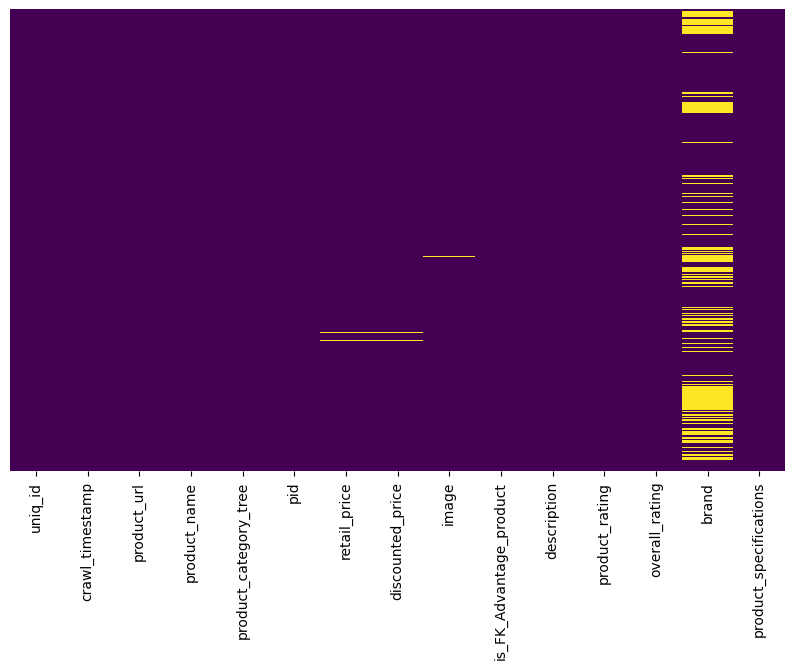

In [30]:
#heatmap showing the distribution of all the Nan's throughout the data
plt.figure(figsize=(10,6))
sns.heatmap(train_data.isnull(), cbar=False, yticklabels=False, cmap = 'viridis')


As we have to predict the category that a particular product belongs to, from the given dataset, only **description** column gives us useful details according to which we can predict its category. Hence, the datapoints having **description** or **product_category_tree** points as NaN cannot be included in our dataset and therefore, they are removed. Also, datapoints having duplicate descriptions are removed as well.

In [31]:
#keeping only those datapoints whose description is not NaN
train_data = train_data[train_data['description'].notna()]
#keeping only those datapoints product_category_tree is not NaN
train_data = train_data[train_data['product_category_tree'].notna()]
#dropping the datapoints with duplicate descriptions
train_data = train_data.drop_duplicates("description",keep='first', inplace=False, ignore_index=True)
train_data = train_data.reset_index(drop=True)
train_data

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""..."
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ..."
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13158,16de377e88660863bc028949aedb8557,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-book-cove...,Thelostpuppy Book Cover for Apple iPad Air 2,Mobiles & Accessories,ACCEA4DZW4GZ3J6Q,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,Thelostpuppy Book Cover for Apple iPad Air 2 (...,No rating available,No rating available,Thelostpuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
13159,9402d23592adc0795e1ca71a661c9a5f,2015-12-20 08:26:17 +0000,http://www.flipkart.com/babes-brass-cuff/p/itm...,Babes Brass Cuff,Jewellery,BBAEAEZ2EYWXWGZS,999.0,749.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Babes Brass Cuff (Pack of 2)\n ...,No rating available,No rating available,Babes,"{""product_specification""=>[{""key""=>""Collection..."
13160,87bcdd46bb48bfc1045d7ee84aef7b7a,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HNDNQYGJU,529.0,295.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection..."
13161,1336909e5468b63c9b1281350eba647d,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HHKJTPHWV,547.0,322.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection..."


## **Dropping the unnecessary columns**

As mentioned earlier, only **description** and **product_category_tree** are of utmost importance in predicting the category of a product, the rest of the columns which do not contribute any meaning to our problem statement are removed. However, some columns like **product_name** and **brand** are still kept for further visualisation of the data.

In [32]:
#list of all the columns in the dataset
train_data.columns.tolist()

['uniq_id',
 'crawl_timestamp',
 'product_url',
 'product_name',
 'product_category_tree',
 'pid',
 'retail_price',
 'discounted_price',
 'image',
 'is_FK_Advantage_product',
 'description',
 'product_rating',
 'overall_rating',
 'brand',
 'product_specifications']

In [33]:
#dropping the columns which do not add much meaning to our problem statement
train_data = train_data.drop(['uniq_id',
               'crawl_timestamp',
               'product_url',
               'pid',
               'retail_price',
               'discounted_price',
               'image',
               'product_rating',
               'overall_rating',
               'is_FK_Advantage_product',
               'product_specifications'], axis = 1)

In [34]:
train_data

,product_name,product_category_tree,description,brand
0,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
1,AW Bellies,Footwear,Key Features of AW Bellies Sandals Wedges Heel...,AW
2,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
3,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
4,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar
...,...,...,...,...
13158,Thelostpuppy Book Cover for Apple iPad Air 2,Mobiles & Accessories,Thelostpuppy Book Cover for Apple iPad Air 2 (...,Thelostpuppy
13159,Babes Brass Cuff,Jewellery,Babes Brass Cuff (Pack of 2)\n ...,Babes
13160,Kenway Retail Brass Copper Cuff,Jewellery,Kenway Retail Brass Copper Cuff\n ...,Kenway Retail
13161,Kenway Retail Brass Copper Cuff,Jewellery,Kenway Retail Brass Copper Cuff\n ...,Kenway Retail


## **Lineplot of Products of a specific Brand**

The below lineplot helps us visualise the frequency of all the products of a particular brand that is available on Flipkart.


In [35]:
#Creating a temporary Dataframe
temp_df = train_data.copy(deep=True)

# Delete the rows and having brand as NaN values
temp_df = temp_df[temp_df['brand'].notna()]
temp_df

,product_name,product_category_tree,description,brand
0,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
1,AW Bellies,Footwear,Key Features of AW Bellies Sandals Wedges Heel...,AW
2,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
3,Alisha Solid Women's Cycling Shorts,Clothing,Key Features of Alisha Solid Women's Cycling S...,Alisha
4,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,"Key Features of dilli bazaaar Bellies, Corpora...",dilli bazaaar
...,...,...,...,...
13158,Thelostpuppy Book Cover for Apple iPad Air 2,Mobiles & Accessories,Thelostpuppy Book Cover for Apple iPad Air 2 (...,Thelostpuppy
13159,Babes Brass Cuff,Jewellery,Babes Brass Cuff (Pack of 2)\n ...,Babes
13160,Kenway Retail Brass Copper Cuff,Jewellery,Kenway Retail Brass Copper Cuff\n ...,Kenway Retail
13161,Kenway Retail Brass Copper Cuff,Jewellery,Kenway Retail Brass Copper Cuff\n ...,Kenway Retail


In [36]:
temp_df.shape

(9005, 4)

In [37]:
#creating a list of all the unique brand names
brands_df = list(dict.fromkeys(list(temp_df.loc[:, 'brand'].values)))

brand_keys = [] #corresponds to the unique brand names
brand_freq = [] #corresponds to the count of the product for a brand

for brand in brands_df:
  #getting the count for that brand
  count = np.sum(temp_df.loc[:, 'brand'].values == brand)
  if count>=10:
    brand_keys.append(brand)
    brand_freq.append(count)

In [38]:
max_count = max(brand_freq)
idx = brand_freq.index(max_count)
print("The brand having maximum amount of products on Flipkart is {} with {} many products".format(brand_keys[idx],max_count))

The brand having maximum amount of products on Flipkart is Allure Auto with 469 many products


From the lineplot below, we can see that most of the brands have less than 100 of their products on Flipkart while some brands have around 300 of their products on Flipkart.

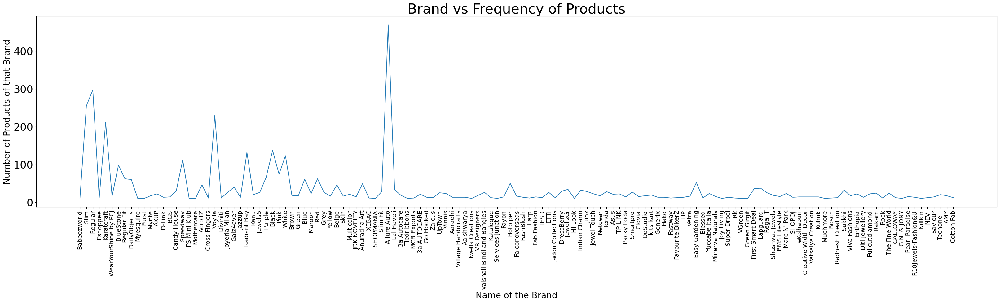

In [39]:
plt.figure(figsize=(40,8))
plt.title("Brand vs Frequency of Products", fontsize=32)
plt.ylabel("Number of Products of that Brand", fontsize=20)
plt.xlabel("Name of the Brand", fontsize=20)
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=24)
sns.lineplot(x=brand_keys, y=brand_freq)
plt.show()

## **Bar Graph of the most common words in Product Description**

A bar graph of the 40 most frequent words occuring in the Product Description is made. This has helped us in adding some words to our stopwords list like shipping, delivery, flipkart, etc (which are then removed) as they do not have much meaning/contribution in the prediction of product category.

In [40]:
import pandas as pd

# Extract the description column
description = train_data["description"].tolist()

# Replace non-string values with empty strings
description = [desc if isinstance(desc, str) else "" for desc in description]

# Update the DataFrame with the cleaned description
train_data["description"] = description

# Output the updated DataFrame
print(train_data)

                                            product_name  \
0                    Alisha Solid Women's Cycling Shorts   
1                                             AW Bellies   
2                    Alisha Solid Women's Cycling Shorts   
3                    Alisha Solid Women's Cycling Shorts   
4      dilli bazaaar Bellies, Corporate Casuals, Casuals   
...                                                  ...   
13158       Thelostpuppy Book Cover for Apple iPad Air 2   
13159                                   Babes Brass Cuff   
13160                    Kenway Retail Brass Copper Cuff   
13161                    Kenway Retail Brass Copper Cuff   
13162                    Kenway Retail Brass Copper Cuff   

        product_category_tree  \
0                   Clothing    
1                   Footwear    
2                   Clothing    
3                   Clothing    
4                   Footwear    
...                       ...   
13158  Mobiles & Accessories    
13159          

In [41]:
description = [desc if isinstance(desc, str) else "" for desc in description]
description

["Key Features of Alisha Solid Women's Cycling Shorts Cotton Lycra Navy, Red, Navy,Specifications of Alisha Solid Women's Cycling Shorts Shorts Details Number of Contents in Sales Package Pack of 3 Fabric Cotton Lycra Type Cycling Shorts General Details Pattern Solid Ideal For Women's Fabric Care Gentle Machine Wash in Lukewarm Water, Do Not Bleach Additional Details Style Code ALTHT_3P_21 In the Box 3 shorts",
 'Key Features of AW Bellies Sandals Wedges Heel Casuals,AW Bellies Price: Rs. 499 Material: Synthetic Lifestyle: Casual Heel Type: Wedge Warranty Type: Manufacturer Product Warranty against manufacturing defects: 30 days Care instructions: Allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,Specifications of AW Bellies General Ideal For Women Occasion Casual Shoe Details Color Red Outer Material Patent Leather Heel Height 1 inch Number 

In [42]:
for i in range(len(description)):
    description[i] = description[i].lower().split()


In [43]:
all_words = list(itertools.chain(*description))
word_counts = Counter(all_words)
word_counts

Counter({'key': 2042,
         'features': 4044,
         'of': 18923,
         'alisha': 14,
         'solid': 3086,
         "women's": 5535,
         'cycling': 82,
         'shorts': 389,
         'cotton': 2080,
         'lycra': 113,
         'navy,': 5,
         'red,': 99,
         'navy,specifications': 1,
         'details': 3249,
         'number': 2065,
         'contents': 1102,
         'in': 11277,
         'sales': 1822,
         'package': 1963,
         'pack': 1695,
         '3': 549,
         'fabric': 2421,
         'type': 2539,
         'general': 2614,
         'pattern': 1156,
         'ideal': 2081,
         'for': 20486,
         'care': 866,
         'gentle': 142,
         'machine': 282,
         'wash': 778,
         'lukewarm': 80,
         'water,': 146,
         'do': 628,
         'not': 1422,
         'bleach': 177,
         'additional': 1063,
         'style': 1493,
         'code': 793,
         'altht_3p_21': 1,
         'the': 13389,
         'b

In [44]:
clean_description = pd.DataFrame(word_counts.most_common(40),
                                 columns=['words', 'count'])
clean_description

,words,count
0,for,20486
1,of,18923
2,only,14610
3,the,13389
4,and,13089
5,in,11277
6,rs.,9963
7,-,9375
8,to,9067
9,with,8917


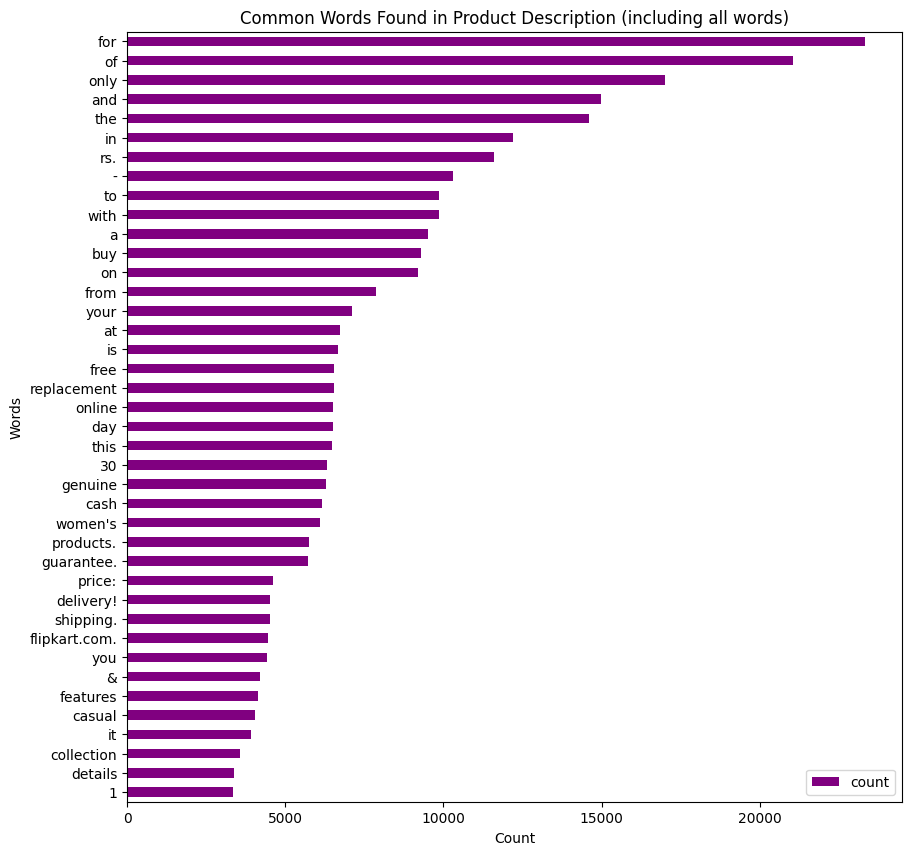

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import itertools

def most_frequent_words(descriptions):
    # Fill missing values with empty strings
    descriptions = [desc if isinstance(desc, str) else "" for desc in descriptions]

    # Convert descriptions to lowercase and split into words
    descriptions = [desc.lower().split() for desc in descriptions]

    # Flatten the list of lists and count word frequencies
    all_words = list(itertools.chain(*descriptions))
    word_counts = Counter(all_words)

    # Create a pandas DataFrame of the 40 most common words
    clean_description = pd.DataFrame(word_counts.most_common(40),
                                     columns=['words', 'count'])

    return clean_description

# Load dataset from CSV file
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Project/train_product_data.csv")


# Extract the description column
description = train_data["description"].tolist()

# Get the most common words
most_common_description = most_frequent_words(description)

fig, ax = plt.subplots(figsize=(10, 10))
# Plotting the bar graph in decreasing sorted order
most_common_description.sort_values(by='count').plot.barh(x='words',
                                                          y='count',
                                                          ax=ax,
                                                          color="purple")

ax.set_title("Common Words Found in Product Description (including all words)")
plt.xlabel("Count")
plt.ylabel("Words")
plt.show()


## **Count of the different Product Categories in the Unfiltered Data**

Through the code snippet below, we are analyzing the different Product Categories and if they have more than 10 products, we are printing them as shown below.

In [46]:
categories_in_df = list(dict.fromkeys(list(train_data.loc[:,'product_category_tree'].values)))
print("The unique Product Categories in this dataset are {}".format(len(categories_in_df)))

for category in categories_in_df:
  count = np.sum(train_data.loc[:, 'product_category_tree'].values == category)
  if(count>=10):
    print(category,"\t",count)

The unique Product Categories in this dataset are 14
Clothing  	 5316
Footwear  	 1083
Pens & Stationery  	 264
Bags, Wallets & Belts  	 158
Home Decor & Festive Needs  	 714
Automotive  	 937
Tools & Hardware  	 379
Baby Care  	 224
Mobiles & Accessories  	 768
Watches  	 526
Toys & School Supplies  	 271
Jewellery  	 3218
Kitchen & Dining  	 610
Computers  	 531


From above, we can clearly see that there are many redundant Product Categories as in the Product Category Tree, a new branch arises for the Brand Name. In the code snippet below, the punctuations in the **product_category_tree** column are removed and **only the FIRST CATEGORY** is considered as the primary category for Product Categorization. This is done so in order to have significant datapoints for each category to train a better model.

In [47]:
primary_category = train_data["product_category_tree"].tolist()

#lowercasing the categories to prevent duplicate categories and removal of punctuations like ">>", etc
for i in range(len(primary_category)):
  primary_category[i] = primary_category[i].lower()
  primary_category[i] = primary_category[i].replace('["',"")
  primary_category[i] = primary_category[i].replace('"]',"")
  primary_category[i] = primary_category[i].replace(" ","")
  primary_category[i] = primary_category[i].split(">>")
  primary_category[i] = primary_category[i][0]

print(primary_category)
print(len(primary_category))

['clothing', 'footwear', 'clothing', 'clothing', 'footwear', 'clothing', 'footwear', 'clothing', 'clothing', 'pens&stationery', 'clothing', 'footwear', 'clothing', 'clothing', 'clothing', 'footwear', 'clothing', 'clothing', 'clothing', 'clothing', 'pens&stationery', 'pens&stationery', 'pens&stationery', 'clothing', 'pens&stationery', 'clothing', 'bags,wallets&belts', 'clothing', 'footwear', 'homedecor&festiveneeds', 'automotive', 'tools&hardware', 'tools&hardware', 'clothing', 'bags,wallets&belts', 'bags,wallets&belts', 'footwear', 'babycare', 'babycare', 'mobiles&accessories', 'clothing', 'pens&stationery', 'babycare', 'homedecor&festiveneeds', 'clothing', 'clothing', 'watches', 'footwear', 'watches', 'footwear', 'watches', 'watches', 'watches', 'clothing', 'footwear', 'watches', 'footwear', 'watches', 'watches', 'footwear', 'footwear', 'watches', 'footwear', 'footwear', 'watches', 'footwear', 'watches', 'footwear', 'footwear', 'clothing', 'footwear', 'footwear', 'watches', 'footwear'

The length of the unique Product Categories after some filtering is 14


<Axes: title={'center': 'Number of products in categories v/s Category'}, xlabel='Product Categories', ylabel='Frequency'>

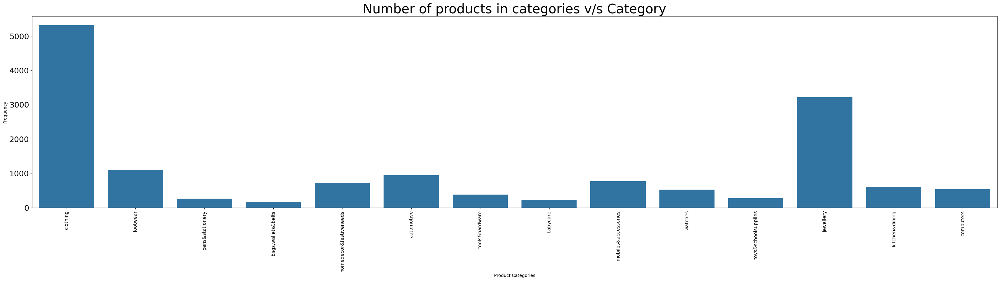

In [48]:
#filtering out some of the categories with count less than 10
primary_category_count = Counter(primary_category)
print("The length of the unique Product Categories after some filtering is {}".format(len(primary_category_count)))

all_categories_temp=[]
count_temp=[]

for keys,vals in primary_category_count.items():
  all_categories_temp.append(keys)
  count_temp.append(vals)

plt.figure(figsize=(40,8))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories_temp, y=count_temp)


From the above bargraph, we can clearly see that there is a lot of noise in the dataset as only the brand/description is sometimes mentioned in the Product Category. To visualise the relevant classes, a bargraph is plotted below that shows only those Product Categories which have at least 10 products

<Axes: title={'center': 'Number of products in categories v/s Category'}, xlabel='Product Categories having frequency at least 10', ylabel='Frequency'>

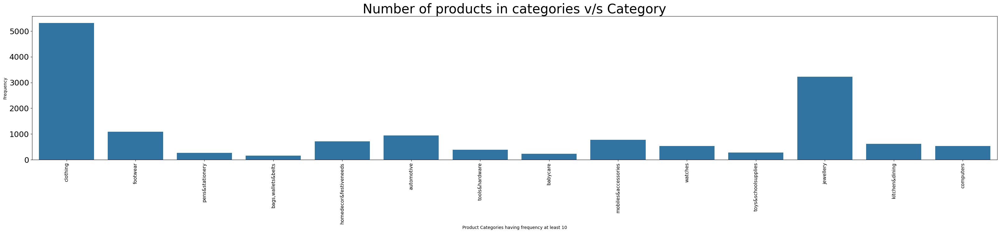

In [49]:
all_categories=[]
count=[]

for keys,vals in primary_category_count.items():
  #choosing only those categories which have at least 10 producrs
  if(vals>=10):
    all_categories.append(keys)
    count.append(vals)

plt.figure(figsize=(40,6))
plt.title("Number of products in categories v/s Category", fontsize=30)
plt.xlabel("Product Categories having frequency at least 10")
plt.ylabel("Frequency")
plt.xticks(fontsize=11,rotation=90)
plt.yticks(fontsize=18)
sns.barplot(x=all_categories, y=count)

## **Combining the redundant categories**

From the above bargraph, we can see that there are some classes which can be grouped together like **sunglasses** and **eyewear** and **homefurnishing** and **home&kitchen**. This will also help us in increasing the datapoints for each category in order to train a better model.  

In [50]:
revised_categories = [None]*len(primary_category)

for i in range(len(primary_category)):
  if primary_category[i]=="homeimprovement" or primary_category[i]=="homedecor&festiveneeds" or primary_category[i]=='home&kitchen' or primary_category[i]=="kitchen&dining" or primary_category[i]=="homefurnishing" or primary_category[i]=="furniture" or primary_category[i]=="homeentertainment":
    revised_categories[i] = 'homefurnishing/kitchen'
  elif primary_category[i]=='pens&stationery':
    revised_categories[i] = 'toys&schoolsupplies'
  elif primary_category[i]=='gaming' or primary_category[i]=='cameras&accessories' or primary_category[i]=='computers' or primary_category[i]=="mobiles&accessories":
    revised_categories[i]='electronics'
  elif primary_category[i]=='health&personal care appliances' or primary_category[i]=='beautyandpersonalcare' or primary_category[i]=='eyewear' or primary_category[i]=='sunglasses' or primary_category[i]=='watches' or primary_category[i]=='bags,wallets&belts' or primary_category[i]=='health&personalcareappliances':
    revised_categories[i]='personalaccessories'
  else:
    revised_categories[i] = primary_category[i]

print("The length of the revised grouped categories are {}".format(len(Counter(revised_categories))))
print(revised_categories)

The length of the revised grouped categories are 10
['clothing', 'footwear', 'clothing', 'clothing', 'footwear', 'clothing', 'footwear', 'clothing', 'clothing', 'toys&schoolsupplies', 'clothing', 'footwear', 'clothing', 'clothing', 'clothing', 'footwear', 'clothing', 'clothing', 'clothing', 'clothing', 'toys&schoolsupplies', 'toys&schoolsupplies', 'toys&schoolsupplies', 'clothing', 'toys&schoolsupplies', 'clothing', 'personalaccessories', 'clothing', 'footwear', 'homefurnishing/kitchen', 'automotive', 'tools&hardware', 'tools&hardware', 'clothing', 'personalaccessories', 'personalaccessories', 'footwear', 'babycare', 'babycare', 'electronics', 'clothing', 'toys&schoolsupplies', 'babycare', 'homefurnishing/kitchen', 'clothing', 'clothing', 'personalaccessories', 'footwear', 'personalaccessories', 'footwear', 'personalaccessories', 'personalaccessories', 'personalaccessories', 'clothing', 'footwear', 'personalaccessories', 'footwear', 'personalaccessories', 'personalaccessories', 'footwe

In [51]:
#creating a new column in the dataframe which stores these revised grouped categories
train_data["primary_categories"] = revised_categories
train_data.head(20)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear
5,4044c0ac52c1ee4b28777417651faf42,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVUHAAVH9X,1199.0,479.0,"[""http://img5a.flixcart.com/image/short/5/z/c/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing
6,e54bc0a7c3429da2ebef0b30331fe3d2,2016-03-25 22:59:23 +0000,http://www.flipkart.com/ladela-bellies/p/itmeh...,Ladela Bellies,Footwear,SHOEH4KM2W3Z6EH5,1724.0,950.0,"[""http://img5a.flixcart.com/image/shoe/s/g/m/b...",False,Key Features of Ladela Bellies Brand: LADELA C...,5,5,Ladela,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear
7,c73e78fb440ff8972e0762daed4fc109,2016-03-25 22:59:23 +0000,http://www.flipkart.com/carrel-printed-women-s...,Carrel Printed Women's,Clothing,SWIEHF3EF5PZAZUY,2299.0,910.0,"[""http://img6a.flixcart.com/image/swimsuit/5/v...",False,Key Features of Carrel Printed Women's Fabric:...,No rating available,No rating available,Carrel,"{""product_specification""=>[{""key""=>""Neck"", ""va...",clothing
8,9aacdecceb404c74abddc513fd2756a8,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FGBDJGX8FW,999.0,379.0,"[""http://img6a.flixcart.com/image/short/q/z/v/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing
9,83c53f8948f508f51d2249b489ca8e7d,2016-03-25 22:59:23 +0000,http://www.flipkart.com/freelance-vacuum-bottl...,Freelance Vacuum Bottles 350 ml Bottle,Pens & Stationery,BOTEGYTZ

In [52]:
temp_categories = list(dict.fromkeys(list(train_data.loc[:,'primary_categories'].values)))

considered_category = []
revised_category_count = {}
noise = {}
all_categories = {}

print("\n")
print("********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************")
print("\n")

for category in temp_categories:
  count = np.sum(train_data.loc[:, 'primary_categories'].values == category)
  all_categories[category]=count
    #a category is considered to be a main category only if the frequency of a product in that category is at least 10
  if(count>=10):
    print(category,count)
    revised_category_count[category] = count
  else:
    noise[category] = count

for i in range(len(revised_categories)):
  if revised_categories[i] in revised_category_count:
    considered_category.append(1)
  else:
    considered_category.append(0)

print("\n")
print("********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************")
print("\n")
for keys,vals in noise.items():
  print(keys,vals)

print("\n")
print("********************* THE NOISE + PRIMARY CATEGORIES IN THE DATASET ARE AS FOLLOWS *************************")
print("\n")
for keys,vals in all_categories.items():
  print(keys,vals)



********************* THE FINAL CONSIDERED CATEGORIES AND THEIR COUNTS ARE AS FOLLOWS *************************


clothing 5316
footwear 1083
toys&schoolsupplies 535
personalaccessories 684
homefurnishing/kitchen 1324
automotive 937
tools&hardware 379
babycare 224
electronics 1299
jewellery 3218


********************* THE NOISE IN THE DATASET IS AS FOLLOWS *************************




********************* THE NOISE + PRIMARY CATEGORIES IN THE DATASET ARE AS FOLLOWS *************************


clothing 5316
footwear 1083
toys&schoolsupplies 535
personalaccessories 684
homefurnishing/kitchen 1324
automotive 937
tools&hardware 379
babycare 224
electronics 1299
jewellery 3218


**Visualisation of the Noise + Primary Categories**

<Axes: >

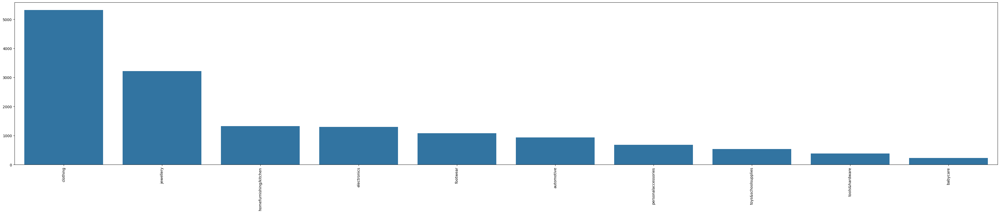

In [53]:
all_categories = dict(sorted(all_categories.items(), key=lambda item: item[1], reverse=True))

all_categories_keys = list(all_categories.keys())
all_categories_freq = list(all_categories.values())

fig = plt.figure(figsize = (48, 8))
plt.xticks(rotation=90)
sns.barplot(x=all_categories_keys ,y=all_categories_freq)

**Visualisation of only Noise in the dataset**

Noise in the dataset consists of all those Product Categories which have less than 10 products in them. From the bargraph below, we can clearly see that most of the noise in the dataset has only 1 product in its category and hence, it wasn't useful to let this noise pass through while training the model. Therefore, it is later removed from the dataset.

<Axes: >

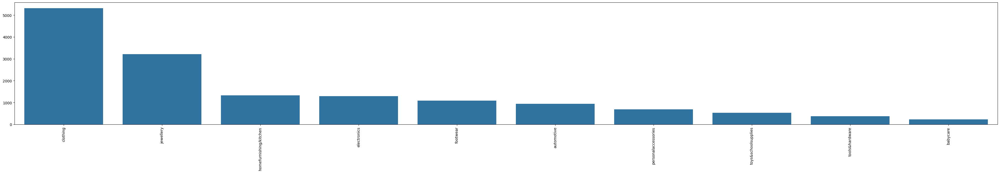

In [54]:
all_categories = dict(sorted(all_categories.items(), key=lambda item: item[1], reverse=True))

all_categories_keys = list(all_categories.keys())
all_categories_freq = list(all_categories.values())

fig = plt.figure(figsize = (48, 6))
plt.xticks(rotation=90)
sns.barplot(x=all_categories_keys ,y=all_categories_freq)

## **Frequency Plot of the revised categories**

The Bargraph shown below shows the frequency of the product in each of the final classes (total classes = 13). These are also the classes into which the final Product Categorization is done. We can see that this dataset is heavily imbalanced with **clothing** category dominating the other categories by more than 50%.

<Axes: >

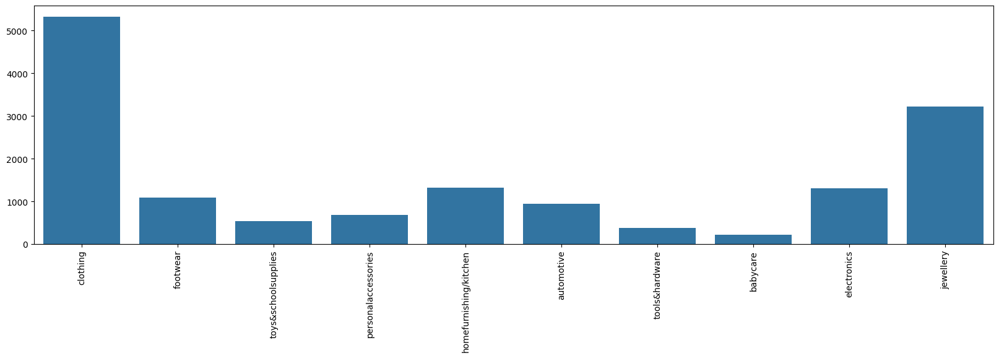

In [55]:
categories = list(revised_category_count.keys())
frequency = list(revised_category_count.values())

fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
sns.barplot(x=categories,y=frequency)

A **main_category** column is added to the dataset having binary values. Its value for a particular row is 1 if that product lies in any of the above mentioned 13 classes, otherwise it is 0.

In [56]:
train_data["main_category"] = considered_category
train_data.head(25)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear,1
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1
5,4044c0ac52c1ee4b28777417651faf42,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVUHAAVH9X,1199.0,479.0,"[""http://img5a.flixcart.com/image/short/5/z/c/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1
6,e54bc0a7c3429da2ebef0b30331fe3d2,2016-03-25 22:59:23 +0000,http://www.flipkart.com/ladela-bellies/p/itmeh...,Ladela Bellies,Footwear,SHOEH4KM2W3Z6EH5,1724.0,950.0,"[""http://img5a.flixcart.com/image/shoe/s/g/m/b...",False,Key Features of Ladela Bellies Brand: LADELA C...,5,5,Ladela,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1
7,c73e78fb440ff8972e0762daed4fc109,2016-03-25 22:59:23 +0000,http://www.flipkart.com/carrel-printed-women-s...,Carrel Printed Women's,Clothing,SWIEHF3EF5PZAZUY,2299.0,910.0,"[""http://img6a.flixcart.com/image/swimsuit/5/v...",False,Key Features of Carrel Printed Women's Fabric:...,No rating available,No rating available,Carrel,"{""product_specification""=>[{""key""=>""Neck"", ""va...",clothing,1
8,9aacdecceb404c74abddc513fd2756a8,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FGBDJGX8FW,999.0,379.0,"[""http://img6a.flixcart.com/image/short/q/z/v/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1
9,83c53f8948f508f51d2249b489ca8e7d,2016-03-25 22:59:23 +0000,http://www.flipkart.com/freelance-vacuum-bottl...,Freelance Vacuum Bottles 350 ml B

**Plotting the number of Brands per Category**

From the graph generated below, we can see that the most variety of brands belongs to the **home furnishing/ kitchen** category.

<Axes: title={'center': 'No of Brands vs Categories'}, xlabel='Categories', ylabel='No of Brands'>

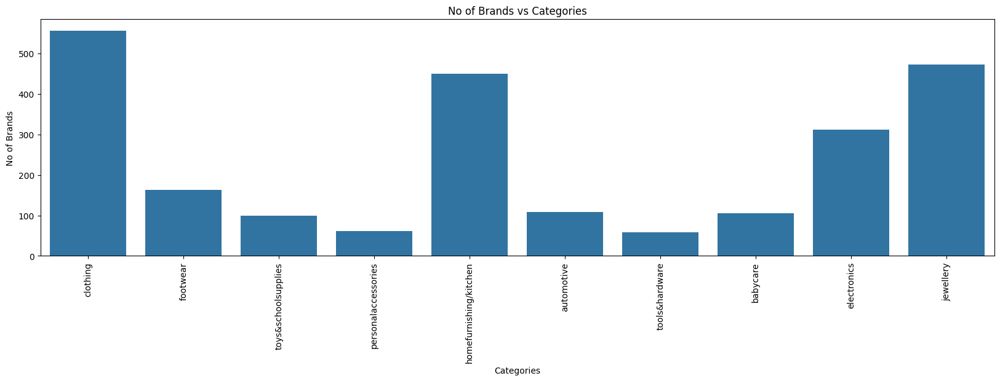

In [57]:
temp_df = train_data.copy(deep=True)
temp_df = temp_df[temp_df['brand'].notna()]
temp_df = temp_df[temp_df["main_category"]==1]

#list containing the revised categories
category_list = []
#list containing the number of brands corresponding to that category
brand_freq_list = []

for category in categories:
  df = temp_df[temp_df["primary_categories"]==category]
  category_brand_count = list(dict.fromkeys(list(df.loc[:,'brand'].values)))
  category_list.append(category)
  brand_freq_list.append(len(category_brand_count))

#plotting the graph
fig = plt.figure(figsize = (20, 5))
plt.xticks(rotation=90)
plt.xlabel("Categories")
plt.ylabel("No of Brands")
plt.title("No of Brands vs Categories")
sns.barplot(x=category_list,y=brand_freq_list)

## **Sentiment Analysis**

Sentiment analysis of the Product Description corresponding to each category. This is done by measuring the polarity of each product's description.

In [58]:
pip install textblob

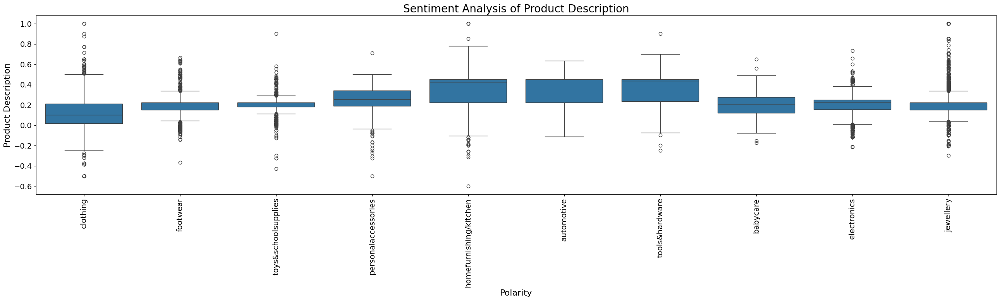

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from textblob import TextBlob

# Assuming train_data is already loaded and contains 'description' and 'primary_categories' columns

# Generate sentiment polarity
train_data['desc_pol'] = train_data['description'].apply(lambda x: TextBlob(str(x)).sentiment.polarity)

# Plotting
plt.figure(figsize=(32, 6))
plt.title("Sentiment Analysis of Product Description", fontsize=20)
plt.xlabel("Polarity", fontsize=16)
plt.ylabel("Product Description", fontsize=16)
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)

# Plot boxplot for sentiment polarity
sns.boxplot(x="primary_categories", y='desc_pol', data=train_data[train_data['main_category'] == 1])
plt.show()


## **Text Length Analysis**

Analysis of the length of the Product Description is done to help us get an idea about the minimum, maximum and average length of the same. This is done in order to decide whether we have to discard some datapoints having text length less than or greater to a threshold.

In [60]:
#finding the length of the description
max_desc_len = -1
desc_len_sum = 0
min_desc_len = maxsize

product_description = train_data["description"].tolist()

for i in range(len(product_description)):
  try:
    max_desc_len = max(max_desc_len,len(product_description[i]))
    min_desc_len = min(min_desc_len,len(product_description[i]))
    desc_len_sum+=len(product_description[i])
  except:
    pass

print("Max description length is {}.".format(max_desc_len))
print("Min description length is {}.".format(min_desc_len))
print("Average description length is {}.".format(desc_len_sum/len(product_description)))

Max description length is 5309.
Min description length is 74.
Average description length is 403.2954196946463.


**Visualisation of the Minimum description length across all the categories**

From the graph below we can see that there are discrepancies in the minimum length across all the categories. **pet supplies** and **ebooks** have a minimum length almost greater than 180 while **clothing** has the minimum length.

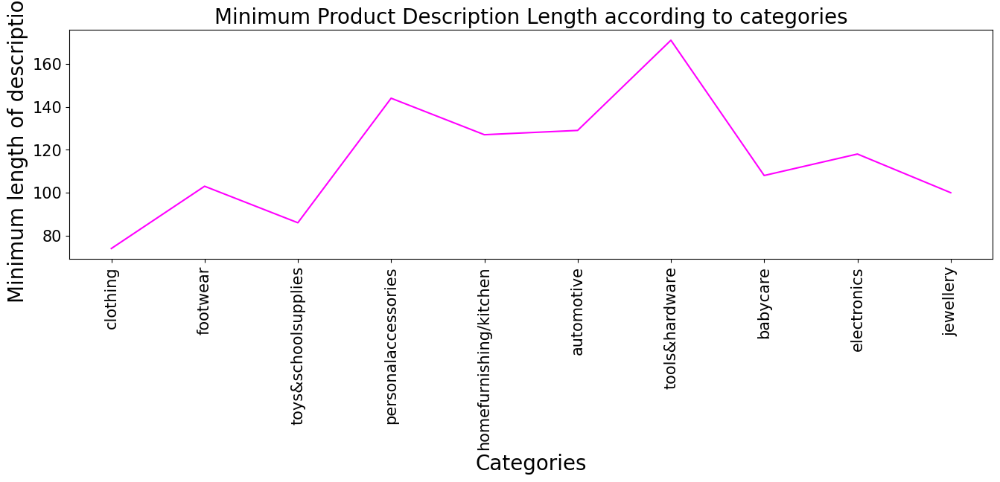

In [61]:
min_len = []
x = []

for category in temp_categories:
  temp_df = train_data[train_data["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_min_len = min(temp_df["description"].str.len())
    x.append(category)
    min_len.append(temp_min_len)
  except:
    pass


plt.figure(figsize=(16,4))
plt.title("Minimum Product Description Length according to categories", fontsize=20)
plt.ylabel("Minimum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,min_len, color = "magenta")

**Visualisation of the Maximum description length across all the categories**

From the graph below we can see that almost all the product description lengths are greater than 2000 with **jewellary** category having the greatest length for product description (greater than 5000)

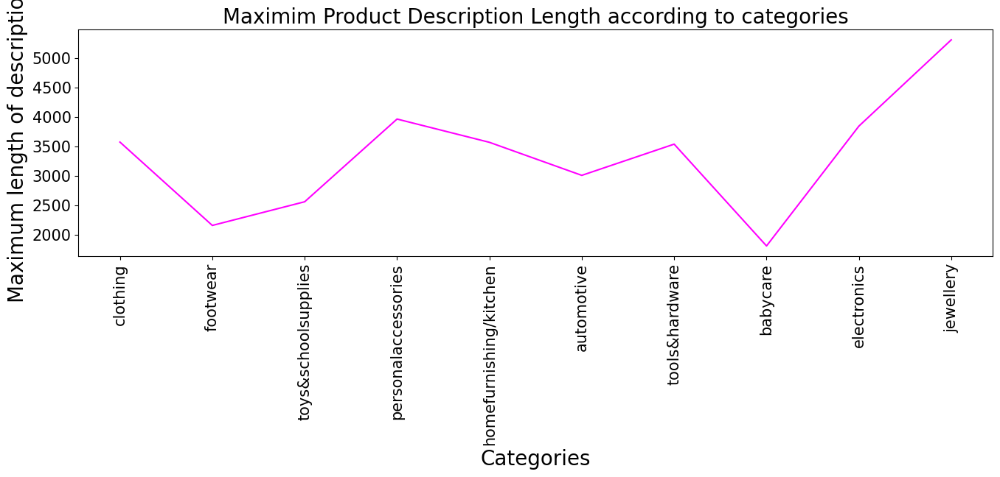

In [62]:
max_len = []
x = []

for category in temp_categories:
  temp_df = train_data[train_data["primary_categories"]==category]
  temp_df = temp_df[temp_df["main_category"]==1]
  try:
    temp_max_len = max(temp_df["description"].str.len())
    x.append(category)
    max_len.append(temp_max_len)
  except:
    pass


plt.figure(figsize=(16,4))
plt.title("Maximim Product Description Length according to categories", fontsize=20)
plt.ylabel("Maximum length of description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15,rotation=90)
plt.yticks(fontsize=15)
plt.plot(x,max_len, color = "magenta")

**Boxplot of the Average description length across all the categories**

From the boxplot, we can see that the average length for all the categories lies more or less around 1000 words. I decided to not go with a certain minimum/maximum words threshold to prevent loss of information.

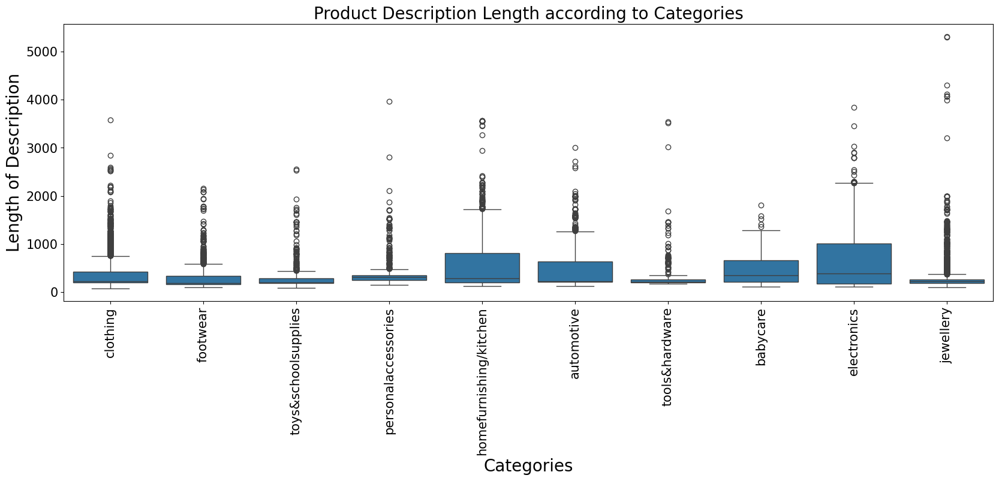

In [63]:
# Calculate the length of product descriptions
train_data['desc_len'] = train_data['description'].str.len()

# Create a boxplot
plt.figure(figsize=(20, 6))
plt.title("Product Description Length according to Categories", fontsize=20)
plt.ylabel("Length of Description", fontsize=20)
plt.xlabel("Categories", fontsize=20)
plt.xticks(fontsize=15, rotation=90)
plt.yticks(fontsize=15)

# Create the boxplot
sns.boxplot(x="primary_categories", y='desc_len', data=train_data[train_data['main_category'] == 1])

plt.show()

## **Word Clouds**

**Word cloud consisting of the most frequent words in the Product Description**

This wordcloud shows the 200 most common words in the raw dataset that was provided. This wordcloud helped a lot to get an idea about removing words such as **[shipping, genuine, cash, product, delivery, flipkart, rs, etc]** as these words are common to the context of all the categories and will not contribute much to predicting the category of a particular product.

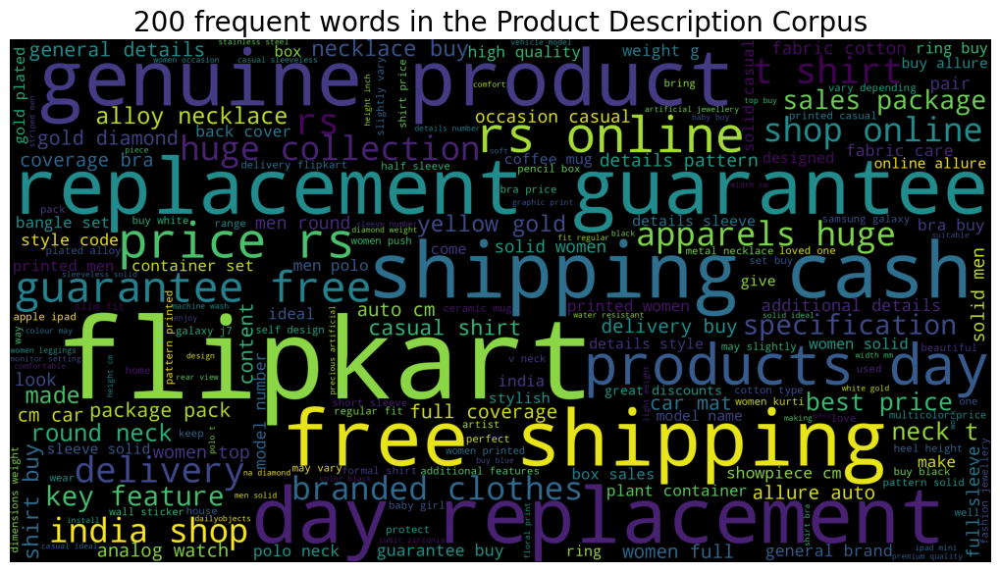

In [64]:
from wordcloud import WordCloud, STOPWORDS

product_content = ""

for i in train_data["description"]:
    i = str(i)
    separate = i.split()
    for j in range(len(separate)):
        separate[j] = separate[j].lower()

    product_content += " ".join(separate)+" "

stop_words = set(STOPWORDS)
final_wordcloud = WordCloud(width = 3000, height = 1600,
                            max_words=200,
                            background_color ='black',
                            stopwords = stop_words,
                            min_font_size = 10).generate(product_content)

plt.figure(figsize = (10, 10), facecolor = None)
plt.title("200 frequent words in the Product Description Corpus", fontsize=20)
plt.imshow(final_wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.show()

**Word Cloud for each Category in the Corpus**

A word cloud for each category showing the 100 most common words across the product description of that category was plotted.

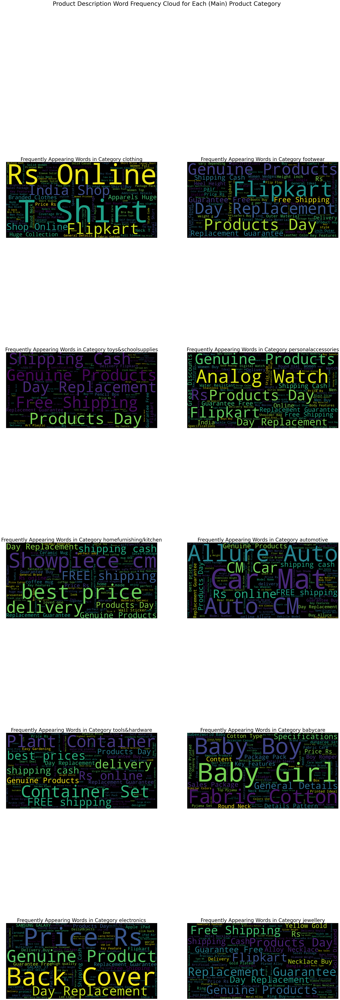

In [65]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import math

# Assuming 'categories' is a list of unique category values in 'primary_categories'
categories = train_data['primary_categories'].unique()

# Define the number of rows for subplots
j = math.ceil(len(categories) / 2)

plt.figure(figsize=(36, 100), facecolor=None)
plt.suptitle("Product Description Word Frequency Cloud for Each (Main) Product Category", fontsize=36)

for i, c in enumerate(categories):
    temp = i + 1
    # Filter descriptions for the current category and convert to string
    desc = train_data[train_data['primary_categories'] == c]['description'].fillna("").astype(str).values
    # Join descriptions into a single string
    desc_text = " ".join(desc)

    plt.subplot(j, 2, temp).set_title(f"Frequently Appearing Words in Category {c}", fontsize=30)

    # Generate and plot word cloud
    word_cloud = WordCloud(background_color="black", max_words=100, stopwords=STOPWORDS, width=1600, height=800, collocations=True)
    word_cloud.generate(desc_text)

    plt.axis("off")
    plt.imshow(word_cloud)

plt.show()


### ***PART 2) Data Cleaning and Pre Processing***

**Character Contraction**

Character contraction is done to look at what percentage of the dataset is in English Characters. Punctuations, numbers, hyperlinks, etc will all be removed during further cleaning of the dataset.

During this analysis of the characters, we can see that there are several emoticons, letters from different languages (Chinese), etc that can be seen. These are then removed from the corpus.

In [66]:
from collections import Counter
from string import ascii_letters, punctuation, digits
import pandas as pd

# Convert all descriptions to strings and handle NaN values
train_data['description'] = train_data['description'].fillna("").astype(str)

# Join all descriptions into a single corpus
corpus = ' '.join(train_data['description']).lower()

# Count character frequencies
characters = Counter(corpus)

# Sort characters by frequency
sorted_characters = sorted(characters.items(), key=lambda i: i[1], reverse=True)

# Calculate the percentage of data consisting of only English characters
total = sum(characters[i] for i in ascii_letters + punctuation + digits)

# Print results
print("The % of data consisting of only English Characters is {:.2f}%.".format(100 * total / len(corpus)))
print("\n")
print(characters)

The % of data consisting of only English Characters is 82.25%.


Counter({' ': 1033954, 'e': 511306, 'a': 383083, 'o': 359960, 'r': 333510, 't': 328974, 'i': 327506, 'n': 310276, 's': 296192, 'l': 270060, 'c': 203925, 'd': 167325, 'h': 145541, 'p': 144840, 'u': 139431, 'f': 126120, 'm': 120425, 'y': 112524, 'g': 106632, 'b': 85234, '.': 81581, 'w': 63936, 'k': 55947, 'v': 43709, ',': 29795, '0': 24847, '\t': 22196, '-': 21907, '1': 20370, '9': 19499, '\n': 17712, '3': 15847, ':': 13670, '2': 13179, "'": 12462, '5': 11646, '4': 10211, 'x': 10068, 'j': 8577, 'z': 7242, '8': 6433, '6': 5912, '!': 5888, '7': 5383, ')': 4957, 'q': 4955, '(': 4766, '&': 4307, '/': 3037, '"': 1306, '%': 895, '_': 694, '\r': 532, '\xa0': 500, '’': 441, '*': 425, '?': 343, ';': 328, '•': 276, '|': 218, '=': 180, '+': 167, 'é': 115, '”': 107, '@': 86, '“': 80, '–': 53, '#': 49, '�': 48, 'â': 39, '¢': 31, '°': 22, '\x80': 21, '…': 18, 'ã': 18, '®': 16, '✔': 15, '‚': 12, '±': 11, '\u2028': 10, '~': 8, '\\': 8, '¬'

In [67]:
# getting all the words ending an apostrophe and single letter
contractions = Counter(re.findall("[a-z]+'[a-z]+", corpus))
apostrophe_end = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_end)

# getting all the words starting with a single letter and an apostrophe
contractions=Counter(re.findall("[a-z]'[a-z]+", corpus))
apostrophe_start = sorted(contractions.items(), key=lambda i: i[1], reverse=True)
print("\n")
print(apostrophe_start)

#getting all the URLS
urls = re.findall('\(*http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))*', corpus)
print("\n")
print(urls)



[("women's", 6138), ("men's", 3104), ("girl's", 898), ("boy's", 603), ("don't", 153), ("you're", 122), ("it's", 81), ("customer's", 48), ("nod'r", 43), ("doesn't", 42), ("they're", 38), ("you'll", 35), ("bra's", 30), ("d'clair", 26), ("won't", 25), ("adapter's", 24), ("laptop's", 24), ("monitor's", 19), ("can't", 19), ("today's", 18), ("manufacturer's", 18), ("woman's", 17), ("phone's", 16), ("india's", 16), ("bras's", 16), ("dede's", 13), ("car's", 12), ("product's", 10), ("model's", 9), ("scheffer's", 9), ("what's", 8), ("wellworth's", 8), ("kid's", 8), ("company's", 8), ("computer's", 8), ("you'd", 7), ("vehicle's", 7), ("finger's", 7), ("ona's", 7), ("seema's", 7), ("viewer's", 7), ("baby's", 7), ("buyer's", 7), ("man's", 6), ("shirt's", 6), ("i'm", 6), ("chef'n", 6), ("kb's", 6), ("l'appel", 6), ("l'elegantae", 6), ("yoshi's", 6), ("lord's", 6), ("cat's", 5), ("aren't", 5), ("vala's", 5), ("one's", 5), ("asia's", 5), ("ruhi's", 5), ("lil'posh", 5), ("d'signer", 4), ("item's", 4)

In [68]:
import nltk
from nltk.corpus import stopwords
from string import punctuation
from wordcloud import WordCloud, STOPWORDS
from nltk.stem import WordNetLemmatizer

# Download the stopwords data if not already downloaded
nltk.download('stopwords')
nltk.download('wordnet')

# Define custom replacements
custom_contracts = {
    "women's" : "women",
    "men's" : "men",
    "girl's" : "girl",
    "boy's" : "boy",
    "don't" : "do not",
    "product's" : "product",
    "it's" : "its",
    "bra's" : "bras",
    "won't": "will not",
    "doesn't" : "does not",
    "l's" : " ",
    "n's" : " ",
    "y's" : " ",
    "n't" : "not",
    "r's" : "rs",
    "u're" : "your",
    "a's" : " ",
    "e's": " "
}

# Create a custom list of stopwords
custom_stopwords = [w for w in set(stopwords.words("english"))]
custom_stopwords += list(punctuation)
stopwords_dataset = ["replacement", "shipping", "delivery", "cash", "rs", "flipkart", "genuine", "details", "guarantee", "free", "flipkart.com"]
custom_stopwords.extend(stopwords_dataset)

# Initialize lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [69]:
custom_contracts = {
    "women's" : "women",
    "men's" : "men",
    "girl's" : "girl",
    "boy's" : "boy",
    "don't" : "do not",
    "product's" : "product",
    "it's" : "its",
    "bra's" : "bras",
    "won't": "will not",
    "doesn't" : "does not",
    "l's" : " ",
    "n's" : " ",
    "y's" : " ",
    "n't" : "not",
    "r's" : "rs",
    "u're" : "your",
    "a's" : " ",
    "e's": " "
}

custom_stopwords = [w for w in set(stopwords.words("english"))]
custom_stopwords += list(punctuation)
stopwords_dataset = ["replacement","shipping","delivery","cash", "rs", "flipkart", "genuine", "details", "guarantee","free", "genuine", "flipkart.com"]
custom_stopwords.extend(stopwords_dataset)
wordnet_lemmatizer = WordNetLemmatizer()

In [70]:
print("Custom Contracts:")
print(custom_contracts)

print("\nCustom Stopwords:")
print(custom_stopwords)

print("\nWordNet Lemmatizer:")
print(wordnet_lemmatizer)

Custom Contracts:
{"women's": 'women', "men's": 'men', "girl's": 'girl', "boy's": 'boy', "don't": 'do not', "product's": 'product', "it's": 'its', "bra's": 'bras', "won't": 'will not', "doesn't": 'does not', "l's": ' ', "n's": ' ', "y's": ' ', "n't": 'not', "r's": 'rs', "u're": 'your', "a's": ' ', "e's": ' '}

Custom Stopwords:
['who', 'shouldn', 'didn', 'isn', 'their', 'between', 'out', 'here', 'its', 'by', 'until', 'if', 't', 'just', "wasn't", 'weren', 'having', 've', "won't", 'nor', 'needn', 'under', 'll', 'again', 'is', 'above', 'd', 'same', "didn't", 'down', 'my', 'own', 'they', 'off', "she's", 'theirs', 'after', "hadn't", 'be', 'ours', 'can', 'ma', 'mightn', 'that', 'were', 'he', 'up', "you'd", "weren't", 'no', 'then', 'through', 'further', 'don', "shouldn't", 'against', 'will', 'once', 'am', "should've", 'yours', 'of', 'such', 'being', 'over', 're', 'mustn', 'so', 'where', 'doing', 'yourselves', 'before', 'each', 'during', 'y', 'only', 'these', "isn't", 'won', 'myself', "shan't"

In the following code snippet, the following things have been taken care of:

* Lowercasing
* Custom Contraction Mapping
* Keeping only the ascii characters in the corpus
* Removal of URLs/ Hyperlinks
* Removal of numbers and punctuations
* Custom Stopword Removal
* Lemmatization
* Removal of extra whitespaces


In [71]:
def clean(text):

  for i in range(len(text)):
    text[i] = text[i].lower()
    text[i] = text[i].replace("\n"," ")
    for keys,values in custom_contracts.items():
      text[i] = text[i].replace(keys,values)
    text[i] = re.sub("[a-z]'[a-z]+", " ", text[i])
    #removing the extra whitespaces
    text[i] = re.sub(' +', ' ', text[i])
    #keeping only the ascii characters -> handles emoticons, letters from other languages, etc
    text[i] = re.sub(r'[^\x00-\x7F]+',' ', text[i])
    #removing the urls
    text[i] = re.sub('[(]?http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F])/)*', ' ', text[i])
    text[i] = ''.join([j for j in text[i] if not j.isdigit()])
    text[i] = text[i].split()
    text[i] = ' '.join([word for word in text[i] if word not in custom_stopwords])
    #removing the punctuations
    text[i] = re.sub(r'[^\w\s]', '', text[i])
    #lemmatization
    text[i] = [wordnet_lemmatizer.lemmatize(w) for w in word_tokenize(text[i])]
    #removing the words which have a length less than 3
    text[i] = [word for word in text[i] if len(word)>=3]

  return text

raw_description = train_data["description"].tolist()
cleaned_description = clean(raw_description)
print(cleaned_description[:5])

[['key', 'feature', 'alisha', 'solid', 'woman', 'cycling', 'short', 'cotton', 'lycra', 'navy', 'red', 'navyspecifications', 'alisha', 'solid', 'woman', 'cycling', 'short', 'short', 'number', 'content', 'sale', 'package', 'pack', 'fabric', 'cotton', 'lycra', 'type', 'cycling', 'short', 'general', 'pattern', 'solid', 'ideal', 'woman', 'fabric', 'care', 'gentle', 'machine', 'wash', 'lukewarm', 'water', 'bleach', 'additional', 'style', 'code', 'altht_p_', 'box', 'short'], ['key', 'feature', 'belly', 'sandal', 'wedge', 'heel', 'casualsaw', 'belly', 'price', 'material', 'synthetic', 'lifestyle', 'casual', 'heel', 'type', 'wedge', 'warranty', 'type', 'manufacturer', 'product', 'warranty', 'manufacturing', 'defect', 'day', 'care', 'instruction', 'allow', 'pair', 'shoe', 'air', 'deodorize', 'regular', 'basis', 'use', 'shoe', 'bag', 'prevent', 'stain', 'mildew', 'dust', 'dry', 'dirt', 'surface', 'using', 'clean', 'cloth', 'use', 'polish', 'shinerspecifications', 'belly', 'general', 'ideal', 'wom

## **Visualisation of the cleaned Dataset**

**Visualisation of the most common words**

40 most common words are plotted in the form of a bargraph after removal of the unnecessary data. From the bargraph, we can clearly see that these are the words which actually can help us in identifying the particular category of a product.

<Axes: title={'center': '40 Most Common Words relevant to Dataset'}, xlabel='Frequency', ylabel='Words'>

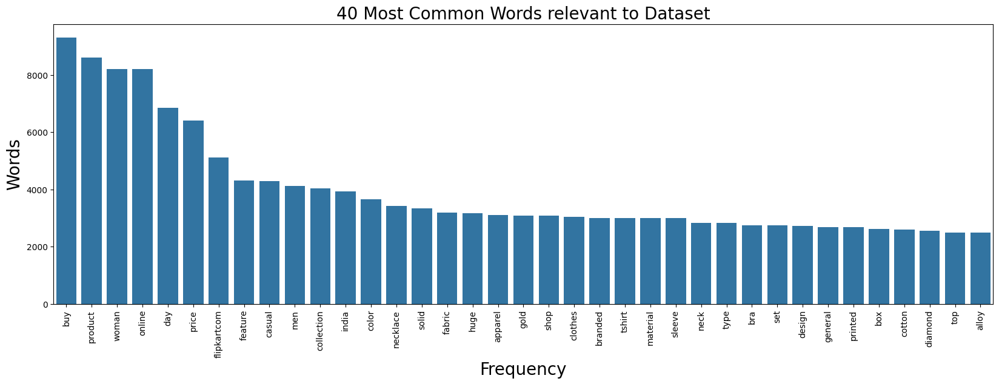

In [72]:
corpus = []
for text in cleaned_description:
  for word in text:
    corpus.append(word)

counter = Counter(corpus)
most=counter.most_common()
x, y = [], []
for word,count in most[:40]:
  if (word not in custom_stopwords):
    x.append(word)
    y.append(count)

plt.figure(figsize=(20,6))
plt.title("40 Most Common Words relevant to Dataset", fontsize=20)
plt.ylabel("Words", fontsize=20)
plt.xlabel("Frequency", fontsize=20)
plt.xticks(rotation=90)
sns.barplot(x=x,y=y)

In [73]:
temp_cleaned_description = [" ".join(sentence) for sentence in cleaned_description]
train_data["cleaned_desc"] = temp_cleaned_description
train_data.head(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.143750,410.0,key feature alisha solid woman cycling short c...
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear,1,0.027778,650.0,key feature belly sandal wedge heel casualsaw ...
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.122917,403.0,key feature alisha solid woman cycling short c...
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.127778,416.0,key feature alisha solid woman cycling short c...
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1,-0.032143,428.0,key feature dilli bazaaar belly corporate casu...
5,4044c0ac52c1ee4b28777417651faf42,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVUHAAVH9X,1199.0,479.0,"[""http://img5a.flixcart.com/image/short/5/z/c/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.098333,419.0,key feature alisha solid woman cycling short c...
6,e54bc0a7c3429da2ebef0b30331fe3d2,2016-03-25 22:59:23 +0000,http://www.flipkart.com/ladela-bellies/p/itmeh...,Ladela Bellies,Footwear,SHOEH4KM2W3Z6EH5,1724.0,950.0,"[""http://img5a.flixcart.com/image/shoe/s/g/m/b...",False,Key Features of Ladela Bellies Brand: LADELA C...,5,5,Ladela,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1,0.215000,358.0,key feature ladela belly brand ladela color bl...
7,c73e78fb440ff8972e0762daed4fc109,2016-03-25 22:59:23 +0000,http://www.flipkart.com/carrel-printed-women-s...,Carrel Printed Women's,Clothing,SWIEHF3EF5PZAZUY,2299.0,910.0,"[""http://img6a.flixcart.com/image/swimsuit/5/v...",False,Key Features of Carrel Printed Women's Fabric:...,No rating available,No rating available,Carrel,"{""product_specification""=>[{""key""=>""Neck"", ""va...",clothing,1,0.339474,1182.0,key feature carrel printed woman fabric swimly...


**Converting the Primary Category of all Noise datapoints into Noise label**

For all the rows in the dataframe where the Main Category is 0 (i.e. noise), then the primary_category label is updated to "noise". This is done to ease the process of plotting the TSNE graphs.

In [74]:
train_data.loc[train_data['main_category'] == 0, 'primary_categories'] = "noise"
train_data.sample(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
4032,18d43074d088e2303f49c51e435fc74c,2015-12-01 12:40:44 +0000,http://www.flipkart.com/voylla-artificial-clas...,Voylla Artificial Classic Textured Alloy Necklace,Jewellery,NKCE9G2BHRUF9TWB,469.0,299.0,"[""http://img6a.flixcart.com/image/necklace-cha...",False,Voylla Artificial Classic Textured Alloy Neckl...,No rating available,No rating available,Voylla,"{""product_specification""=>[{""key""=>""Collection...",jewellery,1,0.004167,227.0,voylla artificial classic textured alloy neckl...
7094,ade438307fe0b52c5330eccf61d46f6a,2016-03-11 11:26:55 +0000,http://www.flipkart.com/swag-india-girl-s-kurt...,Swag India Girl's Kurta and Pallazo Set,Clothing,ETHEGMHHGGCXMSYA,2199.0,1599.0,"[""http://img5a.flixcart.com/image/ethnic-set/s...",False,Key Features of Swag India Girl's Kurta and Pa...,No rating available,No rating available,Swag India,"{""product_specification""=>[{""key""=>""Sleeve"", ""...",clothing,1,0.250000,356.0,key feature swag india girl kurta pallazo set ...
3303,0d7bfb9799a7bb5525ec2d9ea0688f97,2015-12-01 12:40:44 +0000,http://www.flipkart.com/printland-cmw1618-cera...,Printland CMW1618 Ceramic Mug,Kitchen & Dining,MUGEACY82SGHCHYY,458.0,199.0,"[""http://img5a.flixcart.com/image/mug/h/y/y/1-...",False,Printland CMW1618 Ceramic Mug (350 g)\n ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Type"", ""va...",homefurnishing/kitchen,1,0.505000,815.0,printland cmw ceramic mug price printland coff...
4013,f7ea8ca7d5c310f72481e458702d2768,2015-12-01 12:40:44 +0000,http://www.flipkart.com/voylla-artificial-clas...,Voylla Artificial Classic Plain Yellow Gold Pl...,Jewellery,NKCEC8AZQUFGUXGH,459.0,289.0,"[""http://img5a.flixcart.com/image/necklace-cha...",False,Voylla Artificial Classic Plain Yellow Gold Pl...,No rating available,No rating available,Voylla,"{""product_specification""=>[{""key""=>""Brand"", ""v...",jewellery,1,0.144048,467.0,voylla artificial classic plain yellow gold pl...
8848,d2678647b6063708a4ea0ac16fac6154,2016-01-07 04:32:43 +0000,http://www.flipkart.com/alda-3-ply-ss-lid-pan-...,Alda 3 Ply SS Lid Pan 26 cm diameter,Kitchen & Dining,PTPDVPEXQ88YHBEE,3390.0,2790.0,"[""http://img5a.flixcart.com/image/pot-pan/b/e/...",False,Buy Alda 3 Ply SS Lid Pan 26 cm diameter for R...,5,5,Alda,"{""product_specification""=>[{""key""=>""Pan Type"",...",homefurnishing/kitchen,1,0.450000,204.0,buy alda ply lid pan diameter online alda ply ...
200,fc69831b78bfcc3eb4bdd3afa1c9bdaf,2015-12-04 07:25:36 +0000,http://www.flipkart.com/salt-n-pepper-12-298-t...,Salt N Pepper 12-298 Taupe Boots,Footwear,SHOE92ZZVRNZHNSB,4395.0,2150.0,"[""http://img5a.flixcart.com/image/shoe/r/f/a/t...",False,Salt N Pepper 12-298 Taupe Boots\n ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear,1,-0.053333,544.0,salt pepper taupe boot price let crazy pop day...
11676,8008444d4aae3e46c7669fd854bc9ac8,2016-01-01 19:37:22 +0000,http://www.flipkart.com/enthopia-back-cover-ip...,"Enthopia Back Cover for iPad 2, iPad 3, iPad 4",Mobiles & Accessories,ACCDVHJZTAKZGMN4,2895.0,1499.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,"Buy Enthopia Back Cover for iPad 2, iPad 3, iP...",No rating available,No rating available,Enthopia,"{""product_specification""=>[{""key""=>""Stand"", ""v...",electronics,1,0.180000,173.0,buy enthopia back cover ipad ipad ipad flipkar...
3854,12a305dbcde2f4f8375fc711df71d7ce,2015-12-01 12:40:44 +0000,http://www.flipkart.com/village-handicrafts-ro...,"Village Handicrafts Rose Gold Plated Acrylic, ...",Jewellery,NKCEAFM7SFBNX7H5,400.0,378.0,"[""http://img6a.flixcart.com/image/necklace-cha...",False,"Village Handicrafts Rose Gold Plated Acrylic, ...",No rati

## **Visualization of the Overlapping of classes using TSNE Plots**

TSNE Plots are plotted after creating the Product Description's vectors. This helps us in visualization by reducing the 13 dimensional plot into a 2 dimensional plot

In [75]:
pip install yellowbrick

In [76]:
import yellowbrick
print(yellowbrick.__version__)

1.5


In [77]:
# Example preprocessing function
def preprocess_text(text):
    # Implement your text cleaning and preprocessing steps here
    return text.lower()  # This is a placeholder

# Apply preprocessing
train_data['cleaned_desc'] = train_data['description'].apply(preprocess_text)

In [78]:
train_data['cleaned_desc']

,cleaned_desc
0,"key features of alisha solid women's cycling shorts cotton lycra navy, red, navy,specifications of alisha solid women's cycling shorts shorts details number of contents in sales package pack of 3 fabric cotton lycra type cycling shorts general details pattern solid ideal for women's fabric care gentle machine wash in lukewarm water, do not bleach additional details style code altht_3p_21 in the box 3 shorts"
1,"key features of aw bellies sandals wedges heel casuals,aw bellies price: rs. 499 material: synthetic lifestyle: casual heel type: wedge warranty type: manufacturer product warranty against manufacturing defects: 30 days care instructions: allow your pair of shoes to air and de-odorize at regular basis; use shoe bags to prevent any stains or mildew; dust any dry dirt from the surface using a clean cloth; do not use polish or shiner,specifications of aw bellies general ideal for women occasion casual shoe details color red outer material patent leather heel height 1 inch number of contents in sales package pack of 1 in the box one pair of shoes"
2,"key features of alisha solid women's cycling shorts cotton lycra black, red,specifications of alisha solid women's cycling shorts shorts details number of contents in sales package pack of 2 fabric cotton lycra type cycling shorts general details pattern solid ideal for women's fabric care gentle machine wash in lukewarm water, do not bleach additional details style code altght_11 in the box 2 shorts"
3,"key features of alisha solid women's cycling shorts cotton lycra navy, red, white, red,specifications of alisha solid women's cycling shorts shorts details number of contents in sales package pack of 4 fabric cotton lycra type cycling shorts general details pattern solid ideal for women's in the box 4 shorts additional details style code altght4p_26 fabric care gentle machine wash in lukewarm water, do not bleach"
4,"key features of dilli bazaaar bellies, corporate casuals, casuals material: fabric occasion: ethnic, casual, party, formal color: pink heel height: 0,specifications of dilli bazaaar bellies, corporate casuals, casuals general occasion ethnic, casual, party, formal ideal for women shoe details weight 200 g (per single shoe) - weight of the product may vary depending on size. heel height 0 inch outer material fabric color pink"
5,"key features of alisha solid women's cycling shorts cotton lycra white, black, red, black,specifications of alisha solid women's cycling shorts shorts details number of contents in sales package pack of 4 fabric cotton lycra type cycling shorts general details pattern solid ideal for women's fabric care gentle machine wash in lukewarm water, do not bleach additional details style code altght4p_39 in the box 4 shorts"
6,"key features of ladela bellies brand: ladela color : black,ladela bellies price: rs. 950 experience the best bellies from the house of ladela. providing the best material to keep your feet cozy and active for the whole day.,specifications of ladela bellies general occasion casual ideal for women shoe details heel height 0 inch outer material pu color black"
7,"key features of carrel printed women's fabric: swimlycra brand color: black, white,carrel printed women's price: rs. 910 max-coverage swimwear collection from carrel brand, brighten up your swim routine with this best fitting. this swimming costume from the house of carrel is made of imported swim lycra fabric and comes in black & white colour. it has to be washed separately and dry in shade. attractive & classy caressing the water. this swimwear provides excellent protection and chlorine resistance. fast drying combined with flatlock stitching gives an unmatched comfort and helps you to that performance you have been striving for. this swimwear with its comfort and style is your perfect companion at any pool, beach or water activity. time for you to do your own thing and go with the flow. this swimwear lightly padded, for modesty and support. this pro

In [79]:
# Example: Convert categories to string if not already
train_data['primary_categories'] = train_data['primary_categories'].astype(str)

In [80]:
train_data['primary_categories']

,primary_categories
0,clothing
1,footwear
2,clothing
3,clothing
4,footwear
5,clothing
6,footwear
7,clothing
8,clothing
9,toys&schoolsupplies


In [81]:
print(train_data[['cleaned_desc', 'primary_categories']].head())

                                        cleaned_desc primary_categories
0  key features of alisha solid women's cycling s...           clothing
1  key features of aw bellies sandals wedges heel...           footwear
2  key features of alisha solid women's cycling s...           clothing
3  key features of alisha solid women's cycling s...           clothing
4  key features of dilli bazaaar bellies, corpora...           footwear


Unique categories: ['clothing' 'footwear' 'toys&schoolsupplies' 'personalaccessories'
 'homefurnishing/kitchen' 'automotive' 'tools&hardware' 'babycare'
 'electronics' 'jewellery']


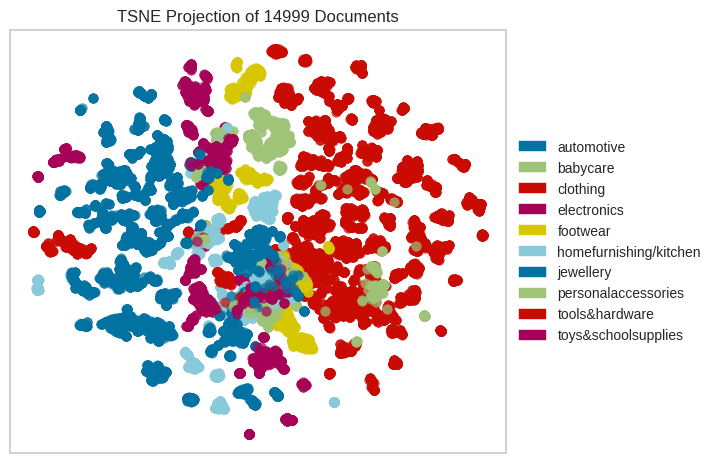

In [82]:
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from yellowbrick.text import TSNEVisualizer

# Check if required columns exist
if 'cleaned_desc' not in train_data.columns or 'primary_categories' not in train_data.columns:
    raise ValueError("DataFrame must contain 'cleaned_desc' and 'primary_categories' columns")

# Create the document vectors
tfidf = TfidfVectorizer()
description = tfidf.fit_transform(train_data["cleaned_desc"])

# Check for unique categories
categories_ = train_data["primary_categories"].astype(str)  # Ensure categories are in string format
unique_categories = categories_.unique()
print("Unique categories:", unique_categories)

# Create the visualizer
tsne = TSNEVisualizer()
tsne.fit_transform(description, categories_)
tsne.poof()

plt.show()

## **Dataframe consisting of categories and their counts**

The following is a dataframe consisting of the frequency of the products and the 13 major categories listed before along with the noise in the dataset.

In [83]:
import pandas as pd

# Assume categories and frequency are lists or can be converted to lists
categories = list(categories)  # Convert to list if it's a NumPy array
frequency = list(frequency)    # Convert to list if it's a NumPy array

# Create temporary dictionary with lists
temp_categories = {
    'primary_category': categories,
    'count': frequency
}

# Append new category and its count
temp_categories['primary_category'].append('noise')
temp_categories['count'].append(len(noise))  # Ensure 'noise' variable is defined

# Convert to DataFrame
category_df = pd.DataFrame(temp_categories)

# Sort DataFrame by 'count' and reset index
category_df = category_df.sort_values(by='count', ascending=False)
category_df = category_df.reset_index(drop=True)

print(category_df)

          primary_category  count
0                 clothing   5316
1                jewellery   3218
2   homefurnishing/kitchen   1324
3              electronics   1299
4                 footwear   1083
5               automotive    937
6      personalaccessories    684
7      toys&schoolsupplies    535
8           tools&hardware    379
9                 babycare    224
10                   noise      0


In [84]:
temp_categories = {
    'primary_category':categories,
    'count':frequency
}


temp_categories['primary_category'].append('noise')
temp_categories['count'].append(len(noise))
category_df = pd.DataFrame(temp_categories)
category_df = category_df.sort_values(by = 'count', ascending=False)
category_df = category_df.reset_index(drop=True)
category_df

,primary_category,count
0,clothing,5316
1,jewellery,3218
2,homefurnishing/kitchen,1324
3,electronics,1299
4,footwear,1083
5,automotive,937
6,personalaccessories,684
7,toys&schoolsupplies,535
8,tools&hardware,379
9,babycare,224


This preprocessed unbalanced dataset is then saved as a csv file for further training. The unbalanced dataset also contains noise in order to check the working of our model on a datset having sufficient noise as well.

In [85]:
#saving the unbalanced dataframe into drive

with open('/content/drive/MyDrive/Colab Notebooks/undersampling_balanced_products.csv', 'w') as f:
  train_data.to_csv(f)

## **Balancing out the Dataset**

From the above plotted bar graphs and the dataframe, we could see that the dataset is very imbalanced with more than half of the dataset residing in **clothing** and **jewellary** categories. 2 of the following dataset balancing techniques are adopted in order to ensure that there is an almost equal frequency of products for each major product category (in order to train an unbiased model and increase the accuracy).

* Oversampling
* Undersampling

### **1) Oversampling**

Random oversampling of the minority classes (i.e. classes apart from clothing and jewellary) is implemented below.  




In [86]:
# a copy of the unbalanced dataset is made on which further work is done
balanced_df = train_data.copy(deep=True)
balanced2_df = train_data.copy(deep=True)
balanced_df

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.143750,410.0,key features of alisha solid women's cycling s...
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear,1,0.027778,650.0,key features of aw bellies sandals wedges heel...
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.122917,403.0,key features of alisha solid women's cycling s...
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.127778,416.0,key features of alisha solid women's cycling s...
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1,-0.032143,428.0,"key features of dilli bazaaar bellies, corpora..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,abda697c6da997f66c78d91d6c88078c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air,Mobiles & Accessories,ACCE9ZY9K4BHVYNA,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air (Mu...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.444898,639.0,thelostpuppy back cover for apple ipad air (mu...
14995,87bcdd46bb48bfc1045d7ee84aef7b7a,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HNDNQYGJU,529.0,295.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection...",jewellery,1,0.500000,669.0,kenway retail brass copper cuff\n ...
14996,b4fad612a9f72f1ffd10134f9be7cfe8,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Z2HKHDGH7JY,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple

Only the 13 major categories are considered and the 237 datapoints classified as noise are also removed from the dataset. This is done to help increase the accuracy of the model that will be trained further. Around 3000 samples for each category is considered in the final oversampled dataset.

In [87]:
from sklearn.utils import resample

balanced_df = balanced_df.loc[balanced_df['main_category'] == 1]

final_balanced_df = {category: balanced_df[balanced_df['primary_categories']==category] for category in set(balanced_df['primary_categories'])}

train_df = pd.concat([resample(data, n_samples=3000, replace=True, random_state=42) for data in final_balanced_df.values()])
train_df

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
14239,144b073f174d8e010ae142552c308912,2015-12-29 05:07:38 +0000,http://www.flipkart.com/orcel-good-quality-por...,Orcel Good Quality Portable Flexible USB USB Fan,Computers,USGEEF3QTHWQ73HZ,599.0,228.0,"[""http://img5a.flixcart.com/image/usb-gadget/3...",False,Orcel Good Quality Portable Flexible USB USB F...,No rating available,No rating available,Orcel,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.231746,1269.0,orcel good quality portable flexible usb usb f...
11677,9c414c000d7f009d4bf472d0c2ec406a,2016-01-01 19:37:22 +0000,http://www.flipkart.com/airplus-book-cover-ipa...,Airplus Book Cover for iPad Air,Mobiles & Accessories,ACCDSB6EJXB8B9GG,2599.0,1499.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,Buy Airplus Book Cover for iPad Air only for R...,4,4,Airplus,"{""product_specification""=>[{""key""=>""Stand"", ""v...",electronics,1,0.225000,157.0,buy airplus book cover for ipad air only for r...
14990,3546393e4e1f874b39de33ffdf9fc053,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Z2HTUFZRNFF,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air 2 (...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.444898,641.0,thelostpuppy back cover for apple ipad air 2 (...
14253,7a12339fbb0444833c65e95c8c980449,2015-12-29 05:07:38 +0000,http://www.flipkart.com/karp-ultra-bright-28-l...,KARP Ultra Bright 28 LEDs USB Lights (White) L...,Computers,USGECNEZPYBCAWGU,699.0,599.0,"[""http://img6a.flixcart.com/image/usb-gadget/w...",False,KARP Ultra Bright 28 LEDs USB Lights (White) L...,No rating available,No rating available,KARP,"{""product_specification""=>[{""key""=>""Lamp Adjus...",electronics,1,0.310559,1695.0,karp ultra bright 28 leds usb lights (white) l...
13860,0fdbd1f86ec520c87dfbfd1ef417430a,2015-12-31 17:07:54 +0000,http://www.flipkart.com/sne-book-cover-iball-3...,SNE Book Cover for IBall 3G 7271 HD70,Mobiles & Accessories,ACCEB5B2BGNR8FJC,1499.0,260.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,SNE Book Cover for IBall 3G 7271 HD70 (White)\...,No rating available,No rating available,SNE,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.000000,405.0,sne book cover for iball 3g 7271 hd70 (white)\...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7577,4e5e1718a61380d944c395384ec5ef0e,2016-01-07 05:50:25 +0000,http://www.flipkart.com/color-palatte-hanging-...,Color Palatte Hanging Planter Plant Container Set,Tools & Hardware,PCSECYY4V8WYRVFY,1800.0,885.0,"[""http://img5a.flixcart.com/image/plant-contai...",False,Buy Color Palatte Hanging Planter Plant Contai...,No rating available,No rating available,Color Palatte,"{""product_specification""=>[{""key""=>""Shape"", ""v...",tools&hardware,1,0.450000,229.0,buy color palatte hanging planter plant contai...
7952,68dbb0b916032a2dc1ded9e9d4a3f8ae,2016-01-07 05:50:25 +0000,http://www.flipkart.com/blessed-plain-plant-co...,Blessed Plain Plant Container Set,Tools & Hardware,PCSDY5AHM2SEJM4K,1000.0,1000.0,"[""http://img6a.flixcart.com/image/plant-contai...",True,Buy Blessed Plain Plant Container Set for Rs.1...,No rating available,No rating available,Blessed,"{""product_specification""=>[{""key""=>""Shape"", ""v...",tools&hardware,1,0.228571,198.0,buy blessed plain plant container set for rs.1...
7396,ba7393eddfb4ec837b5c0b3f358669a7,2016-01-07 05:50:25 +0000,http://www.flipkart.com/easy-gardening-12-inch...,Easy Gardening 12 Inch Elegance Plant Containe...,Tools & Hardwa

**Dataframe showing the count of the new oversampled datapoints**

In [88]:
temp_balanced_categories = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(train_df.loc[:, 'primary_categories'].values == category)
  temp_balanced_categories['primary_category'].append(category)
  temp_balanced_categories['count'].append(count)

category_balanced_df = pd.DataFrame(temp_balanced_categories)
category_balanced_df = category_balanced_df.sort_values(by = 'count', ascending=False)
category_balanced_df = category_balanced_df.reset_index(drop=True)
category_balanced_df

,primary_category,count
0,clothing,3000
1,footwear,3000
2,toys&schoolsupplies,3000
3,personalaccessories,3000
4,homefurnishing/kitchen,3000
5,automotive,3000
6,tools&hardware,3000
7,babycare,3000
8,electronics,3000
9,jewellery,3000


In [96]:
#saving the oversampling balanced dataframe into drive

with open('/content/drive/MyDrive/Colab Notebooks/un_balanced_products.csv', 'w') as f:
  train_data.to_csv(f)

### **2) Undersampling**

Random undersampling of the majority classes (i.e. clothing and jewellary) is implemented below.  

In [97]:
balanced2_df

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,c2d766ca982eca8304150849735ffef9,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FF9KEDEFGF,999.0,379.0,"[""http://img5a.flixcart.com/image/short/u/4/a/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.143750,410.0,key features of alisha solid women's cycling s...
1,f449ec65dcbc041b6ae5e6a32717d01b,2016-03-25 22:59:23 +0000,http://www.flipkart.com/aw-bellies/p/itmeh4grg...,AW Bellies,Footwear,SHOEH4GRSUBJGZXE,999.0,499.0,"[""http://img5a.flixcart.com/image/shoe/7/z/z/r...",False,Key Features of AW Bellies Sandals Wedges Heel...,No rating available,No rating available,AW,"{""product_specification""=>[{""key""=>""Ideal For""...",footwear,1,0.027778,650.0,key features of aw bellies sandals wedges heel...
2,0973b37acd0c664e3de26e97e5571454,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2F6HUZMQ6SJ,699.0,267.0,"[""http://img5a.flixcart.com/image/short/6/2/h/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.122917,403.0,key features of alisha solid women's cycling s...
3,ce5a6818f7707e2cb61fdcdbba61f5ad,2016-03-25 22:59:23 +0000,http://www.flipkart.com/alisha-solid-women-s-c...,Alisha Solid Women's Cycling Shorts,Clothing,SRTEH2FVVKRBAXHB,1199.0,479.0,"[""http://img6a.flixcart.com/image/short/p/j/z/...",False,Key Features of Alisha Solid Women's Cycling S...,No rating available,No rating available,Alisha,"{""product_specification""=>[{""key""=>""Number of ...",clothing,1,0.127778,416.0,key features of alisha solid women's cycling s...
4,29c8d290caa451f97b1c32df64477a2c,2016-03-25 22:59:23 +0000,http://www.flipkart.com/dilli-bazaaar-bellies-...,"dilli bazaaar Bellies, Corporate Casuals, Casuals",Footwear,SHOEH3DZBFR88SCK,699.0,349.0,"[""http://img6a.flixcart.com/image/shoe/b/p/n/p...",False,"Key Features of dilli bazaaar Bellies, Corpora...",No rating available,No rating available,dilli bazaaar,"{""product_specification""=>[{""key""=>""Occasion"",...",footwear,1,-0.032143,428.0,"key features of dilli bazaaar bellies, corpora..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14994,abda697c6da997f66c78d91d6c88078c,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air,Mobiles & Accessories,ACCE9ZY9K4BHVYNA,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air (Mu...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.444898,639.0,thelostpuppy back cover for apple ipad air (mu...
14995,87bcdd46bb48bfc1045d7ee84aef7b7a,2015-12-20 08:26:17 +0000,http://www.flipkart.com/kenway-retail-brass-co...,Kenway Retail Brass Copper Cuff,Jewellery,BBAEA49HNDNQYGJU,529.0,295.0,"[""http://img5a.flixcart.com/image/bangle-brace...",False,Kenway Retail Brass Copper Cuff\n ...,No rating available,No rating available,Kenway Retail,"{""product_specification""=>[{""key""=>""Collection...",jewellery,1,0.500000,669.0,kenway retail brass copper cuff\n ...
14996,b4fad612a9f72f1ffd10134f9be7cfe8,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Z2HKHDGH7JY,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple

In [98]:
# the datapoints are separated out into jewellary, clothing and non jewellary and clothing entries

jewellary_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'jewellery']
clothing_df = balanced2_df.loc[balanced2_df['primary_categories'] == 'clothing']
not_jewellary_clothing = balanced2_df.loc[balanced2_df['primary_categories'] != 'clothing']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['primary_categories'] != 'jewellery']
not_jewellary_clothing = not_jewellary_clothing.loc[not_jewellary_clothing['main_category'] == 1]

print(jewellary_df.shape, clothing_df.shape, not_jewellary_clothing.shape)

(3218, 20) (5316, 20) (6465, 20)


Only the 13 major categories are considered and the 237 datapoints classified as noise are also removed from the dataset. This is done to help increase the accuracy of the model that will be trained further. Around 1700 samples for clothing and jewellary categories are considered in the final undersampled dataset. This number is chosen by keeping the frequency of the other categories in mind while trying not to lose useful information during undersampling.

In [99]:
clothing_down = resample(clothing_df, replace = False, n_samples = 1700, random_state = 42)
jewellary_down = resample(jewellary_df, replace = False, n_samples = 1700, random_state = 42)

print(clothing_down.shape, jewellary_down.shape)

(1700, 20) (1700, 20)


In [100]:
undersampled_bal = pd.concat([clothing_down, jewellary_down, not_jewellary_clothing])
undersampled_bal = undersampled_bal.reset_index(drop=True)
undersampled_bal

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,primary_categories,main_category,desc_pol,desc_len,cleaned_desc
0,0d6c3228f2a49c6a6bd63813ae5f3593,2016-01-06 18:20:45 +0000,http://www.flipkart.com/betty-girl-s-maxi-dres...,Betty Girl's Maxi Dress,Clothing,DREECJD8CZDDUJNU,2070.0,2070.0,"[""http://img6a.flixcart.com/image/dress/3/x/h/...",False,Betty Girl's Maxi Dress - Buy Orange Betty Gir...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Ideal For""...",clothing,1,0.133333,177.0,betty girl's maxi dress - buy orange betty gir...
1,5534b3c7844caca22bd6cca8953d37aa,2016-01-07 05:50:25 +0000,http://www.flipkart.com/fnme-casual-printed-wo...,FnMe Casual Printed Women's Kurti,Clothing,KRTE5RNER2AGFGCV,1099.0,499.0,"[""http://img5a.flixcart.com/image/kurti/g/c/v/...",False,"FnMe Casual Printed Women's Kurti - Buy Black,...",No rating available,No rating available,NaN,"{""product_specification""=>[{""value""=>""1 Kurti""...",clothing,1,-0.109524,203.0,"fnme casual printed women's kurti - buy black,..."
2,281ad47bc53dfbc878f44518c2e04cc3,2016-04-13 02:13:26 +0000,http://www.flipkart.com/bodycare-boy-s-vest/p/...,Bodycare Boy's Vest,Clothing,VESEHC6PHMF6H4RK,594.0,594.0,"[""http://img5a.flixcart.com/image/vest/m/z/n/9...",False,Specifications of Bodycare Boy's Vest (Pack of...,No rating available,No rating available,Bodycare,"{""product_specification""=>[{""key""=>""Sleeve"", ""...",clothing,1,0.237500,309.0,specifications of bodycare boy's vest (pack of...
3,cef5401276c6fd745ee3e267c8778d39,2016-04-14 21:59:46 +0000,http://www.flipkart.com/zastraa-women-s-maxi-d...,Zastraa Women's Maxi Dress,Clothing,DREEH9494PKYSMZD,1399.0,700.0,"[""http://img5a.flixcart.com/image/dress/p/3/g/...",False,Key Features of Zastraa Women's Maxi Dress Pin...,No rating available,No rating available,Zastraa,"{""product_specification""=>[{""key""=>""Length"", ""...",clothing,1,0.212500,306.0,key features of zastraa women's maxi dress pin...
4,ba20bb28d742cda1003c3c4a32d7043b,2015-12-03 03:14:16 +0000,http://www.flipkart.com/aarushi-fashion-casual...,Aarushi Fashion Casual Printed Women's Kurti,Clothing,KRTEBDGPFTF6N6GR,1299.0,505.0,"[""http://img5a.flixcart.com/image/kurti/n/y/w/...",False,Aarushi Fashion Casual Printed Women's Kurti -...,No rating available,No rating available,NaN,"{""product_specification""=>[{""value""=>""1 Kurti""...",clothing,1,-0.120000,218.0,aarushi fashion casual printed women's kurti -...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9860,3546393e4e1f874b39de33ffdf9fc053,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Z2HTUFZRNFF,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air 2 (...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.444898,641.0,thelostpuppy back cover for apple ipad air 2 (...
9861,db59c8a81dc72cf89297e6b886a6d7a8,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air,Mobiles & Accessories,ACCEA4CAW3E3ETWG,2199.0,599.0,"[""http://img5a.flixcart.com/image/cases-covers...",False,TheLostPuppy Back Cover for Apple iPad Air (Mu...,No rating available,No rating available,TheLostPuppy,"{""product_specification""=>[{""key""=>""Brand"", ""v...",electronics,1,0.444898,639.0,thelostpuppy back cover for apple ipad air (mu...
9862,401b1ca6535ffba4aaa5657e0d7a4172,2015-12-20 08:26:17 +0000,http://www.flipkart.com/thelostpuppy-back-cove...,TheLostPuppy Back Cover for Apple iPad Air 2,Mobiles & Accessories,ACCE9Y6MMCPATM3H,2199.0,599.0,"[""http://img6a.flixcart.com/image/cases-covers...",False,The

**Dataframe showing the count of the new undersampled datapoints**

In [101]:
temp_undersampled = {
    'primary_category':[],
    'count':[]
}

for category in categories:
  count = np.sum(undersampled_bal.loc[:, 'primary_categories'].values == category)
  temp_undersampled['primary_category'].append(category)
  temp_undersampled['count'].append(count)

underbalanced_count = pd.DataFrame(temp_undersampled)
underbalanced_count = underbalanced_count.sort_values(by = 'count', ascending=False)
underbalanced_count = underbalanced_count.reset_index(drop=True)
underbalanced_count

,primary_category,count
0,clothing,1700
1,jewellery,1700
2,homefurnishing/kitchen,1324
3,electronics,1299
4,footwear,1083
5,automotive,937
6,personalaccessories,684
7,toys&schoolsupplies,535
8,tools&hardware,379
9,babycare,224


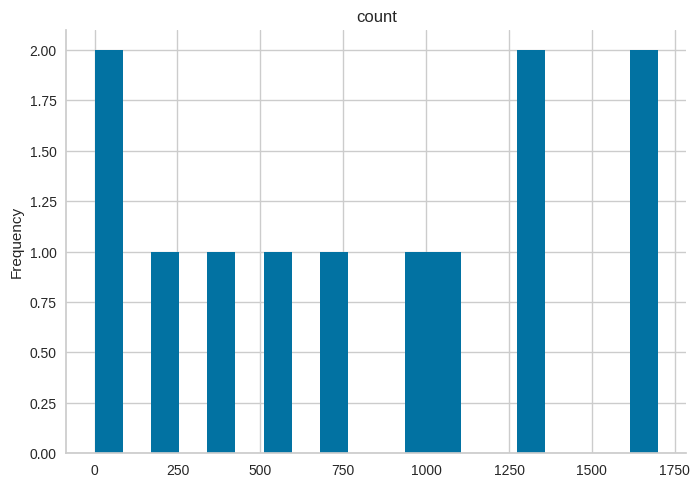

In [102]:
from matplotlib import pyplot as plt
underbalanced_count['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)